In [242]:
#############
###paths#####
#############
import sys
import os

pwd = os.getcwd()
modellingpath = pwd.rpartition("modelling")[0] + pwd.rpartition("modelling")[1] 
sys.path.append(modellingpath + '/lib')
#############
import pickle as pkl
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from scipy.optimize import curve_fit


In [243]:

def plotData(inducer, rfpExp_list, gfpExp_list, semRed, semGreen,pad=0.01, inducerName='OC14'):
    fig,ax = plt.subplots()

    ax.plot(inducer,rfpExp_list,label='RFP', c='red')
    ax.scatter(inducer,rfpExp_list, c='red')
    ax.errorbar(inducer,rfpExp_list,yerr=semRed,c='red',fmt='o')
    ax.legend(loc='center left') #upper right
    ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$')
    ax.set_xscale('log')


    ax2=ax.twinx()
    ax2.plot(inducer,gfpExp_list,label='GFP', c='green')
    ax2.scatter(inducer,gfpExp_list, c='green')
    ax2.errorbar(inducer,gfpExp_list,yerr=semGreen,c='green',fmt='o')
    ax2.legend(loc='center right') #upper left
    ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$')
    ax.set_xscale('log')
    ax.set_xlabel(f'{inducerName} concentration (µM)')

    plt.show()

def plotFitvsData(inducer,inducer_continuous, gfpExp_list, rfpExp_list, semGreen, semRed,doseResponseGreen,doseResponseRed,pad=0.01):
    fig,ax = plt.subplots()

    ax.plot(inducer_continuous,doseResponseRed,label='RFP', c='red')
    ax.scatter(inducer,rfpExp_list, c='red')
    ax.errorbar(inducer,rfpExp_list,yerr=semRed,c='red',fmt='o')
    ax.legend(loc='center left') #upper right
    ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$')
    ax.set_xscale('log')


    ax2=ax.twinx()
    ax2.plot(inducer_continuous,doseResponseGreen,label='GFP', c='green')
    ax2.scatter(inducer,gfpExp_list, c='green')
    ax2.errorbar(inducer,gfpExp_list,yerr=semGreen,c='green',fmt='o')
    ax2.legend(loc='center right') #upper left
    ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$')
    ax.set_xscale('log')


    plt.show()


## 1 Subcircuit 1


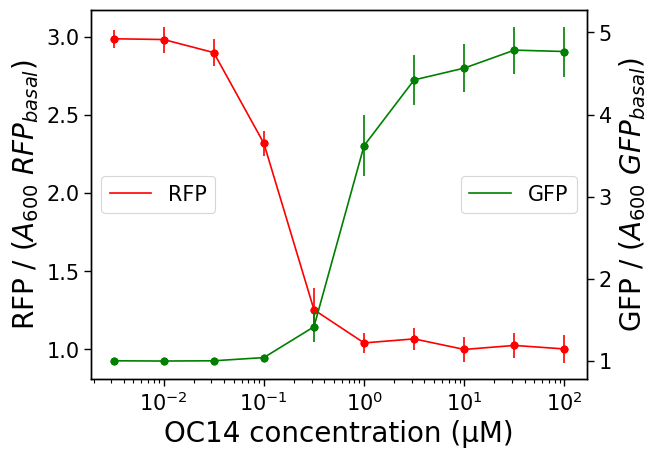

[1.003048780487805,
 1.0,
 1.003048780487805,
 1.0419207317073171,
 1.4169207317073171,
 3.620426829268293,
 4.421493902439025,
 4.564786585365853,
 4.783536585365854,
 4.766768292682927]

In [16]:
doseResponseExp1 = pkl.load(open('input/liquid_culture/curatedData/Jure_subcircuit1_circuit14_doseResponseOC14_0.5ATC.pkl','rb'))
OC14_list1= np.array(doseResponseExp1['OC14']); gfpExp_list1 = list(doseResponseExp1['mean_gfp']); rfpExp_list1 = list(doseResponseExp1['mean_rfp'])
semGreen1 = doseResponseExp1['std_gfp']; semRed1 = doseResponseExp1['std_rfp']
plotData(OC14_list1, rfpExp_list1, gfpExp_list1, semRed1, semGreen1)

gfpExp_list1

In [23]:

nvd = 2
nfe = 20
nda=2
nce=3
def gfp1_steadystate(OC14, Vf,Kvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    # nvd=2
    F1 = 1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return F1

def rfp1_steadystate(OC14, Vf,Kvd,Ve,Kfe): 
    muv = 0.0225 ; kv =  0.0183 ;
    # nvd=2;nfe=5
    
    E1 = 1 + Ve*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))/(Kfe+1e-8))**nfe))

    return E1


OC14_continuous  =np.logspace(-2.5,2,100)



def steadystate(OC14, Vf,Kvd,Ve,Kfe):

  F = gfp1_steadystate(OC14,  Vf,Kvd)
  E = rfp1_steadystate(OC14,Vf,Kvd,Ve,Kfe)
  
  return np.concatenate((F,E))




# popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,bounds = (0,10), maxfev = 100000000)
popt, pcov = curve_fit(f=steadystate, xdata=OC14_list1, ydata=np.concatenate((gfpExp_list1,rfpExp_list1)) , bounds=(0,100), maxfev = 100000000)
                       

# gfpFit, rfpFit = steadystate(OC14data_new, *popt)
# fluorescenceFit = steadystate(OC14data_new, *popt)
# fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
paramNames = [ 'Vf','Kvd','Ve','Kfe']
pfitDict = {}
for param in popt:
    pfitDict[paramNames[popt.tolist().index(param)]] = param
pfitDict

{'Vf': 3.7016492939066823,
 'Kvd': 0.5753030988307931,
 'Ve': 2.362347612130366,
 'Kfe': 1.0849015724892344}

popt [3.70164929 0.5753031  2.36234761 1.08490157]
[1.00007401 1.00073977 1.00738392 1.07253524 1.6166045  3.4672248
 4.52526964 4.68322105 4.69979818 4.7014641  2.97477463 2.97044309
 2.92524827 2.31599396 1.00081082 1.         1.         1.
 1.         1.        ]


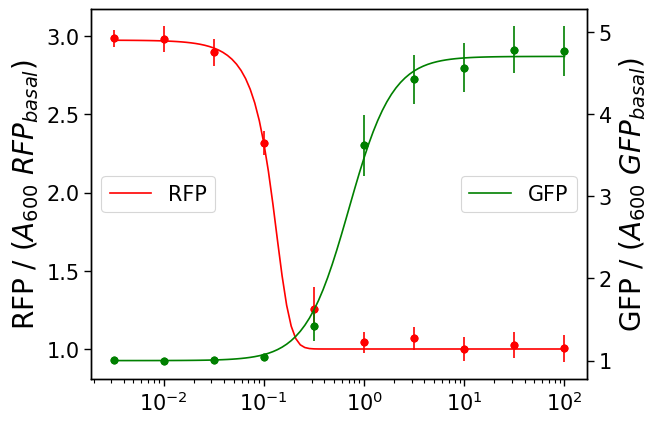

array([1.00007401, 1.00073977, 1.00738392, 1.07253524, 1.6166045 ,
       3.4672248 , 4.52526964, 4.68322105, 4.69979818, 4.7014641 ,
       2.97477463, 2.97044309, 2.92524827, 2.31599396, 1.00081082,
       1.        , 1.        , 1.        , 1.        , 1.        ])

In [25]:
fluorescenceFit = steadystate(OC14_list1, *popt)
print('popt',popt)
fluorescenceFit_continuous = steadystate(OC14_continuous, *popt)

gfpFit1 = fluorescenceFit[:10]; rfpFit1 = fluorescenceFit[10:20]
gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]
print(fluorescenceFit)
plotFitvsData(OC14_list1,OC14_continuous, gfpExp_list1, rfpExp_list1, semGreen1, semRed1, gfpFit1_continuous,rfpFit1_continuous)

gfpFit1_continuous_copy,rfpFit1_continuous_copy = gfpFit1_continuous,rfpFit1_continuous

fluorescenceFit

In [35]:


sampled_parameters = np.random.multivariate_normal(popt,pcov*10, size=1000, check_valid='warn')#
constrained_parameters = [p for p in sampled_parameters if np.all(p>0.11) and np.all(p<2857)]
positive_parameters = [p for p in sampled_parameters if np.all(p>0.11)]
print(positive_parameters)

[array([3.77436058, 0.80059893, 3.22275555, 0.95206753]), array([3.6838856 , 0.59544999, 3.19501932, 1.02482582]), array([3.58349078, 0.56719673, 1.5963542 , 1.15431674]), array([3.78177378, 0.54479933, 2.09043707, 1.08696807]), array([3.82948367, 0.56175506, 1.95683314, 1.10785241]), array([3.48312034, 0.54051558, 2.99830428, 1.0355075 ]), array([3.71524891, 0.60952262, 2.12606188, 1.08007421]), array([3.60705013, 0.63667906, 2.84505806, 0.9957919 ]), array([3.60258821, 0.4799483 , 2.0422539 , 1.11951575]), array([3.56576399, 0.47880242, 2.04801873, 1.09404382]), array([3.86593041, 0.67720008, 2.78044333, 1.03570187]), array([3.95508944, 0.61283042, 2.93634718, 1.01598347]), array([3.73960354, 0.51424454, 3.30546466, 1.00095687]), array([3.81020044, 0.47880973, 2.46130938, 1.06465086]), array([3.78841989, 0.54789996, 1.34361996, 1.15694341]), array([3.78199491, 0.70107342, 2.39404013, 1.03175113]), array([4.0325604 , 0.70953196, 1.98734116, 1.11790337]), array([3.83478871, 0.73609833,

In [32]:
def steadystateloss(OC14, Ve, Vf, Kvd,  Kfe):

  F1 = gfp1_steadystate(OC14,  Vf,Kvd)
  E1 = rfp1_steadystate(OC14,Vf,Kvd,Ve, Kfe)

  # FE = np.hstack([F1,E1, D3, E3])
  FE = [F1,E1]

  return FE

def func(p):
    loss_i = 0

    for count,OC14 in enumerate(OC14_list1):
      model= steadystateloss(OC14_list1[count],*p)
      loss_i+= ((gfpExp_list1[count] - model[0])**2 + (rfpExp_list1[count] - model[1])**2 )
      # loss_i+= (((gfpExp_list[count] - model[0])**2)/(semGreen.values[count]+1e-8)+ ((rfpExp_list[count] - model[1])**2)/(semRed.values[count]+1e-8))
      # loss_i+= (gfpExp_list[count] - model)**2
    return loss_i

lossList = []
for count,p in enumerate(sampled_parameters):
   lossList.append(func(p))


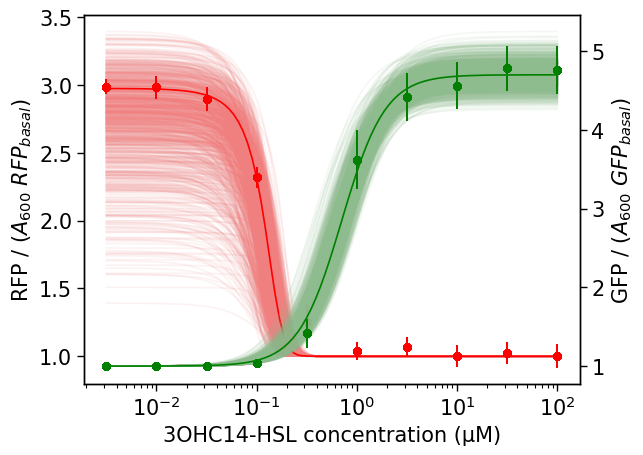

In [36]:

fig,ax = plt.subplots()
ax2=ax.twinx()
OC14_continuous  =np.logspace(-2.5,2,100)

for p in sampled_parameters:


    fluorescenceFit = steadystate(OC14_list1, *p)
    fluorescenceFit_continuous = steadystate(OC14_continuous, *p)

    gfpFit1 = fluorescenceFit[:10]; rfpFit1 = fluorescenceFit[10:20]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]
    ax2.plot(OC14_continuous, gfpFit1_continuous, c='darkseagreen', alpha=0.1)
    ax.plot(OC14_continuous, rfpFit1_continuous, c='lightcoral', alpha=0.1)
    ax2.scatter(OC14_list1,gfpExp_list1 , label='data', c='green')
    ax2.errorbar(OC14_list1,gfpExp_list1,yerr=semGreen1,c='green',fmt='o')
    ax.scatter(OC14_list1,rfpExp_list1 , label='data', c='red')
    ax.errorbar(OC14_list1,rfpExp_list1,yerr=semRed1,c='red',fmt='o')
    plt.xscale('log')


# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$',fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)',fontsize=15)
ax.plot(OC14_continuous, rfpFit1_continuous_copy, c='red', alpha=1)
ax2.plot(OC14_continuous, gfpFit1_continuous_copy, c='green', alpha=1)
plt.show()

# fig,ax = plt.subplots()
# ax2=ax.twinx()
# for p in sampled_parameters:
#     fluorescenceFit = steadystate(OC14data_new, *p)
#     fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
#     gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
#     gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    
#     ax2.plot(OC14_continuous, gfpFit3_continuous, c='darkseagreen', alpha=0.08)
#     ax.plot(OC14_continuous, rfpFit3_continuous, c='lightcoral', alpha=0.08)
#     ax2.scatter(OC14_list3,gfpExp_list3 , label='data', c='green')
#     ax2.errorbar(OC14_list3,gfpExp_list3,yerr=semGreen3,c='green',fmt='o')
#     ax.scatter(OC14_list3,rfpExp_list3 , label='data', c='red')
#     ax.errorbar(OC14_list3,rfpExp_list3,yerr=semRed3,c='red',fmt='o')
#     plt.xscale('log')


# # ax.legend(loc='center left') #upper right
# ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
# ax.set_xscale('log')
# # ax2.legend(loc='center right') #upper left
# ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$', fontsize=15)
# ax.set_xscale('log')
# ax.set_xlabel(f'3OHC14-HSL concentration (µM)', fontsize=15)

# ax.plot(OC14_continuous, rfpFit3_continuous_copy, c='red', alpha=1)
# ax2.plot(OC14_continuous, gfpFit3_continuous_copy, c='green', alpha=1)
# plt.show()

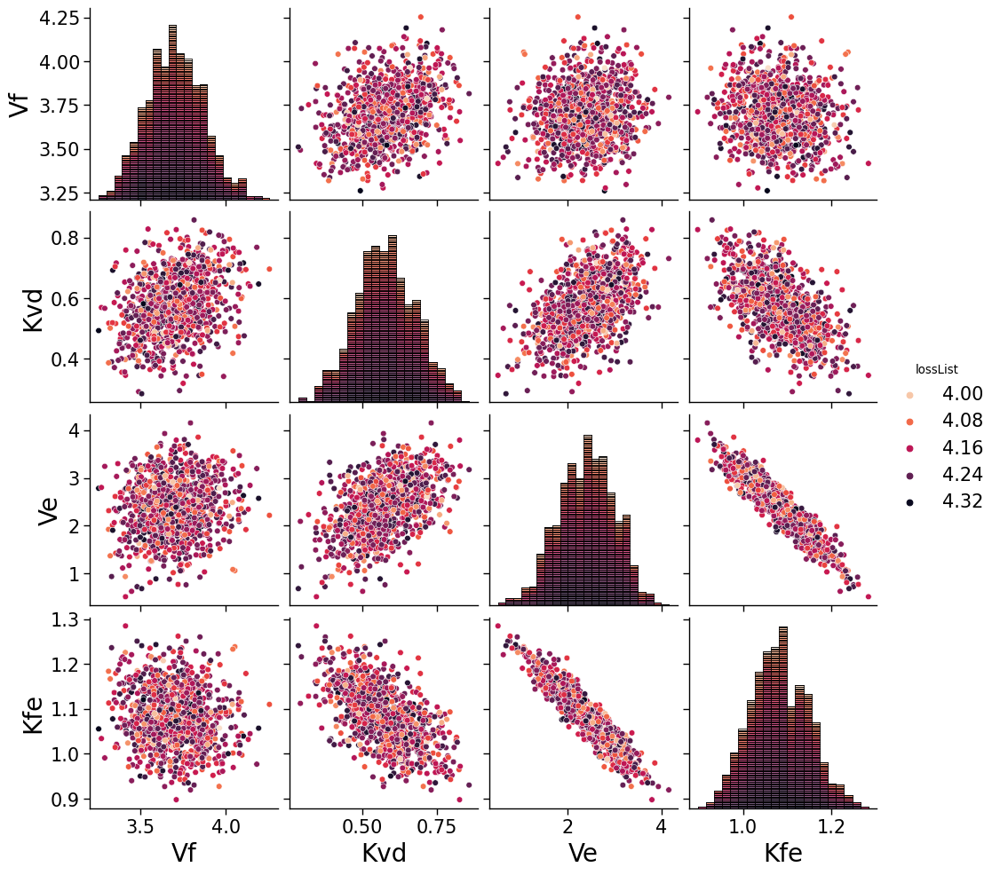

In [37]:
import pandas as pd
import seaborn as sns
sns.set_context("paper", rc={"axes.labelsize":20, "xtick.labelsize":15, "ytick.labelsize":15, "legend.fontsize":15, "axes.titlesize":20})

df = pd.DataFrame(sampled_parameters, columns=paramNames)
df['lossList'] = np.log(lossList)

sns.pairplot(df, hue="lossList", diag_kind='hist', diag_kws={'multiple': 'stack'},palette='rocket_r')


## 1 Subcircuit 3


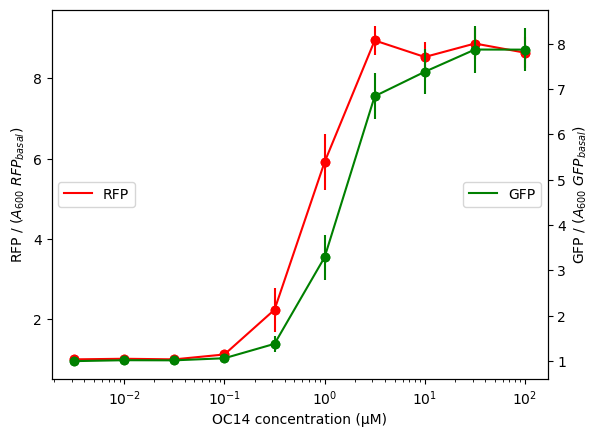

[1.0,
 1.0202797202797202,
 1.0174825174825175,
 1.0636363636363635,
 1.381118881118881,
 3.290909090909091,
 6.8433566433566435,
 7.382517482517482,
 7.872727272727272,
 7.87062937062937]

In [4]:
doseResponseExp1 = pkl.load(open('input/liquid_culture/curatedData/Jure_subcircuit3_circuit14_doseResponseOC14_0.5ATC.pkl','rb'))
OC14_list1= np.array(doseResponseExp1['OC14']); gfpExp_list1 = list(doseResponseExp1['mean_gfp']); rfpExp_list1 = list(doseResponseExp1['mean_rfp'])
semGreen1 = doseResponseExp1['std_gfp']; semRed1 = doseResponseExp1['std_rfp']
plotData(OC14_list1, rfpExp_list1, gfpExp_list1, semRed1, semGreen1)

gfpExp_list1

In [42]:
nvd = 2
nfe = 20
nda=3
nce=3

def gfp3_steadystate(OC14,  Vd,Kvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    D = 1 + Vd*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return D

def bfp3_steadystate(D,Vc,Kda):
    C = 1 + Vc*(1/(1+((D/(Kda+1e-8))**nda)))
    # E = 1 + Ve*(1/(1+(Kfe/(F+1e-8))**nfe))

    # E = 1 + Ve*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))/(Kfe+1e-8))**nfe))

    return C

def rfp3_steadystate(D,Vc, Kda,  Ve,Kce): 

    E = 1 + Ve*(1/(1+((bfp3_steadystate(D, Vc, Kda)/(Kce+1e-8))**nce)))
    # E = 1 + Ve*(1/(1+(Kfe/(F+1e-8))**nfe))

    # E = 1 + Ve*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))/(Kfe+1e-8))**nfe))

    return E



OC14_continuous  =np.logspace(-2.5,2,100)



def steadystate(OC14, Vd,Kvd,Vc, Kda, Ve,Kce):

  D = gfp3_steadystate(OC14,  Vd,Kvd)
  E = rfp3_steadystate(D,Vc, Kda,  Ve,Kce)
  
  return np.concatenate((D,E))




popt, pcov = curve_fit(f=steadystate, xdata=OC14_list1, ydata=np.concatenate((gfpExp_list1,rfpExp_list1)) , bounds=(0,10000), maxfev = 100000000)
                       

# gfpFit, rfpFit = steadystate(OC14data_new, *popt)
# fluorescenceFit = steadystate(OC14data_new, *popt)
# fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
paramNames = [ 'Vd','Kvd','Vc', 'Kda', 'Ve','Kce']
pfitDict = {}
for param in popt:
    pfitDict[paramNames[popt.tolist().index(param)]] = param
pfitDict

{'Vd': 6.7911343874138215,
 'Kvd': 1.1307255890269734,
 'Vc': 3.3558084225054516,
 'Kda': 1.2488721865514307,
 'Ve': 9999.999994184347,
 'Kce': 0.09325325779810689}

popt [6.79113439e+00 1.13072559e+00 3.35580842e+00 1.24887219e+00
 9.99999999e+03 9.32532578e-02]
[1.00003515 1.00035139 1.00351201 1.03495655 1.33408598 3.31561593
 6.69116983 7.66236702 7.77803409 7.78982208 1.2434966  1.2436587
 1.24528658 1.26227434 1.51138248 6.05770131 8.59834881 8.76141455
 8.77595598 8.77739201]


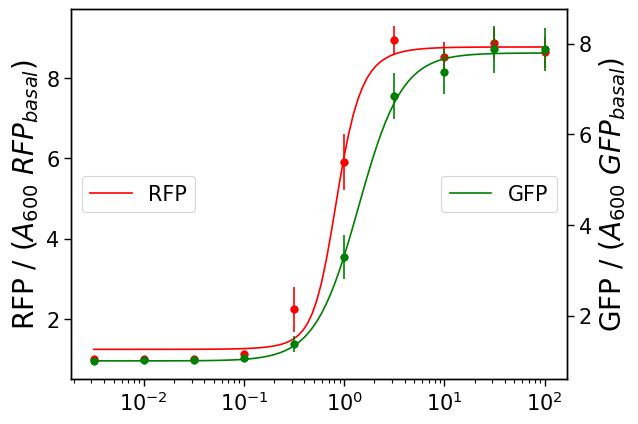

array([1.00003515, 1.00035139, 1.00351201, 1.03495655, 1.33408598,
       3.31561593, 6.69116983, 7.66236702, 7.77803409, 7.78982208,
       1.2434966 , 1.2436587 , 1.24528658, 1.26227434, 1.51138248,
       6.05770131, 8.59834881, 8.76141455, 8.77595598, 8.77739201])

In [43]:
fluorescenceFit = steadystate(OC14_list1, *popt)
print('popt',popt)
fluorescenceFit_continuous = steadystate(OC14_continuous, *popt)

gfpFit1 = fluorescenceFit[:10]; rfpFit1 = fluorescenceFit[10:20]
gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]
print(fluorescenceFit)
plotFitvsData(OC14_list1,OC14_continuous, gfpExp_list1, rfpExp_list1, semGreen1, semRed1, gfpFit1_continuous,rfpFit1_continuous)

gfpFit1_continuous_copy,rfpFit1_continuous_copy = gfpFit1_continuous,rfpFit1_continuous

fluorescenceFit

In [44]:


sampled_parameters = np.random.multivariate_normal(popt,pcov*1, size=100, check_valid='warn')#
constrained_parameters = [p for p in sampled_parameters if np.all(p>0.11) and np.all(p<2857)]
positive_parameters = [p for p in sampled_parameters if np.all(p>0.11)]
print(positive_parameters)

[]


/var/folders/bt/1cqt3cks1sl9cz4dfwlyxhpm0000gn/T/ipykernel_7924/3649520054.py:1: RuntimeWarning: covariance is not positive-semidefinite.
  sampled_parameters = np.random.multivariate_normal(popt,pcov*1, size=100, check_valid='warn')#


In [45]:
def steadystateloss(OC14, Vd,Kvd,Vc, Kda, Ve,Kce):

  D = gfp3_steadystate(OC14,  Vd,Kvd)
  E = rfp3_steadystate(D,Vc, Kda,  Ve,Kce)
  FE = [D,E]

  return FE


def func(p):
    loss_i = 0

    for count,OC14 in enumerate(OC14_list1):
      model= steadystateloss(OC14_list1[count],*p)
      loss_i+= ((gfpExp_list1[count] - model[0])**2 + (rfpExp_list1[count] - model[1])**2 )
      # loss_i+= (((gfpExp_list[count] - model[0])**2)/(semGreen.values[count]+1e-8)+ ((rfpExp_list[count] - model[1])**2)/(semRed.values[count]+1e-8))
      # loss_i+= (gfpExp_list[count] - model)**2
    return loss_i

lossList = []
for count,p in enumerate(sampled_parameters):
   lossList.append(func(p))


In [35]:
OC14_continuous  =np.logspace(-2.5,2,100)
paramMin = positive_parameters[lossList.index(min(lossList))]
paramMax = positive_parameters[lossList.index(max(lossList))]
plt.plot(OC14_continuous, steadystate(OC14_continuous,*paramMin)[:100], 'o', label='min')

plt.plot(OC14_continuous, steadystate(OC14_continuous,*paramMax)[:100], 'o', label='max')
plt.xscale('log')
plt.legend

IndexError: list index out of range

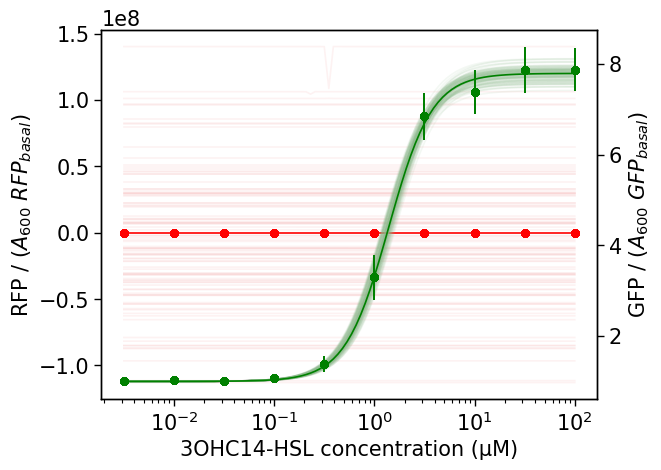

In [46]:

fig,ax = plt.subplots()
ax2=ax.twinx()
OC14_continuous  =np.logspace(-2.5,2,100)

for p in sampled_parameters:


    fluorescenceFit = steadystate(OC14_list1, *p)
    fluorescenceFit_continuous = steadystate(OC14_continuous, *p)

    gfpFit1 = fluorescenceFit[:10]; rfpFit1 = fluorescenceFit[10:20]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]
    ax2.plot(OC14_continuous, gfpFit1_continuous, c='darkseagreen', alpha=0.1)
    ax.plot(OC14_continuous, rfpFit1_continuous, c='lightcoral', alpha=0.1)
    ax2.scatter(OC14_list1,gfpExp_list1 , label='data', c='green')
    ax2.errorbar(OC14_list1,gfpExp_list1,yerr=semGreen1,c='green',fmt='o')
    ax.scatter(OC14_list1,rfpExp_list1 , label='data', c='red')
    ax.errorbar(OC14_list1,rfpExp_list1,yerr=semRed1,c='red',fmt='o')
    plt.xscale('log')


# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$',fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)',fontsize=15)
ax.plot(OC14_continuous, rfpFit1_continuous_copy, c='red', alpha=1)
ax2.plot(OC14_continuous, gfpFit1_continuous_copy, c='green', alpha=1)
plt.show()

# fig,ax = plt.subplots()
# ax2=ax.twinx()
# for p in sampled_parameters:
#     fluorescenceFit = steadystate(OC14data_new, *p)
#     fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
#     gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
#     gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    
#     ax2.plot(OC14_continuous, gfpFit3_continuous, c='darkseagreen', alpha=0.08)
#     ax.plot(OC14_continuous, rfpFit3_continuous, c='lightcoral', alpha=0.08)
#     ax2.scatter(OC14_list3,gfpExp_list3 , label='data', c='green')
#     ax2.errorbar(OC14_list3,gfpExp_list3,yerr=semGreen3,c='green',fmt='o')
#     ax.scatter(OC14_list3,rfpExp_list3 , label='data', c='red')
#     ax.errorbar(OC14_list3,rfpExp_list3,yerr=semRed3,c='red',fmt='o')
#     plt.xscale('log')


# # ax.legend(loc='center left') #upper right
# ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
# ax.set_xscale('log')
# # ax2.legend(loc='center right') #upper left
# ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$', fontsize=15)
# ax.set_xscale('log')
# ax.set_xlabel(f'3OHC14-HSL concentration (µM)', fontsize=15)

# ax.plot(OC14_continuous, rfpFit3_continuous_copy, c='red', alpha=1)
# ax2.plot(OC14_continuous, gfpFit3_continuous_copy, c='green', alpha=1)
# plt.show()

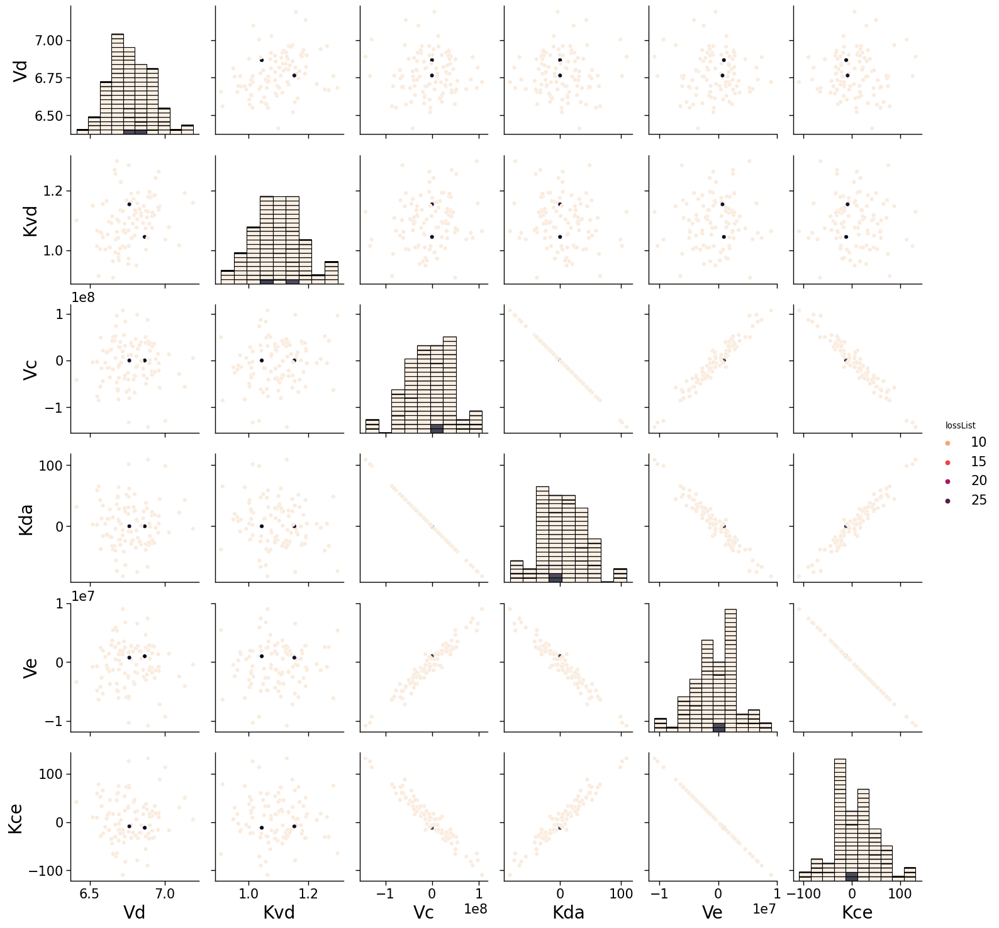

In [37]:
import pandas as pd
import seaborn as sns
sns.set_context("paper", rc={"axes.labelsize":20, "xtick.labelsize":15, "ytick.labelsize":15, "legend.fontsize":15, "axes.titlesize":20})

df = pd.DataFrame(sampled_parameters, columns=paramNames)
df['lossList'] = np.log(lossList)

sns.pairplot(df, hue="lossList", diag_kind='hist', diag_kws={'multiple': 'stack'},palette='rocket_r')


## Combined subcircuits

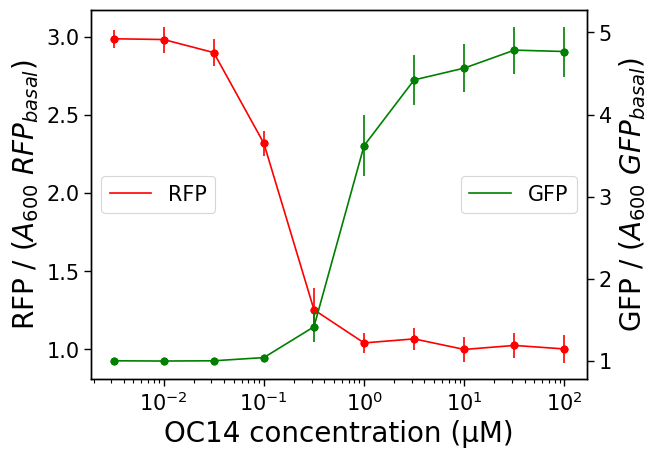

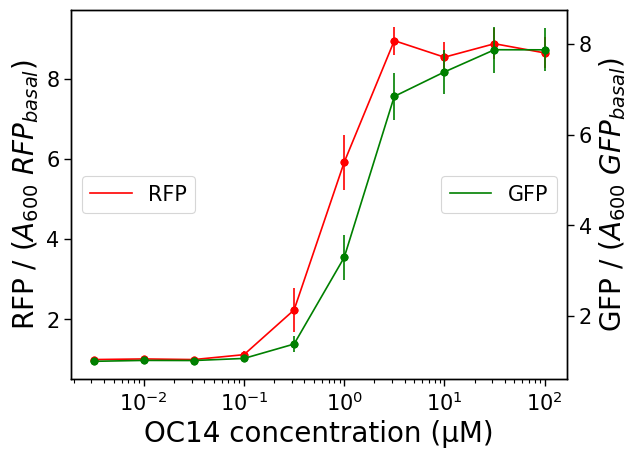

8.946564885496183


In [262]:
doseResponseExp1 = pkl.load(open('input/liquid_culture/curatedData/Jure_subcircuit1_circuit14_doseResponseOC14_0.5ATC.pkl','rb'))
OC14_list1= np.array(doseResponseExp1['OC14']); gfpExp_list1 = list(doseResponseExp1['mean_gfp']); rfpExp_list1 = list(doseResponseExp1['mean_rfp'])
semGreen1 = doseResponseExp1['std_gfp']; semRed1 = doseResponseExp1['std_rfp']
plotData(OC14_list1, rfpExp_list1, gfpExp_list1, semRed1, semGreen1)



doseResponseExp3 = pkl.load(open('input/liquid_culture/curatedData/Jure_subcircuit3_circuit14_doseResponseOC14_0.5ATC.pkl','rb'))
OC14_list3= np.array(doseResponseExp3['OC14']); gfpExp_list3 = list(doseResponseExp3['mean_gfp']); rfpExp_list3 = list(doseResponseExp3['mean_rfp'])
semGreen3 = doseResponseExp3['std_gfp']; semRed3 = doseResponseExp3['std_rfp']
plotData(OC14_list3, rfpExp_list3, gfpExp_list3, semRed3, semGreen3)
print(np.amax([rfpExp_list3, rfpExp_list1]))


In [263]:


nvd = 2
nfe = 20
nda=2
nce=3

# Ve = print(np.amax([rfpExp_list3, rfpExp_list1])) - 1
def gfp1_steadystate(OC14, Vf,Kvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    F1 = 1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return F1

def rfp1_steadystate(OC14, Vf,Kvd,Ve,Kfe): 
    muv = 0.0225 ; kv =  0.0183 ;
    E1 = 1 + Ve*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))/(Kfe+1e-8))**nfe))

    return E1



def gfp3_steadystate(OC14,  Vd,Kvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    D3 = 1 + Vd*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return D3

def bfp3_steadystate(D,Vc,Kda):
    C3 = 1 + Vc*(1/(1+((D/(Kda+1e-8))**nda)))
    return C3

def rfp3_steadystate(D,Vc, Kda,  Ve,Kce): 

    E3 = 1 + Ve*(1/(1+((bfp3_steadystate(D, Vc, Kda)/(Kce+1e-8))**nce)))
    return E3


OC14_continuous = np.logspace(-3,2, 100)


def steadystate(OC14,Vc,Vd,Ve,Vf, Kvd,Kda, Kfe, Kce):
  
  if len(OC14) == 22:
      gaps = [5,5,6,6]
  else:
        gaps = [int(len(OC14)/4)]*4
  F1 = gfp1_steadystate(OC14[:np.sum(gaps[:1])],  Vf,Kvd)
  E1 = rfp1_steadystate(OC14[np.sum(gaps[:1]):np.sum(gaps[:2])],Vf,Kvd,Ve,Kfe)
  D3 = gfp3_steadystate(OC14[np.sum(gaps[:2]):np.sum(gaps[:3])], Vd,Kvd)
  E3 = rfp3_steadystate(OC14[np.sum(gaps[:3]):np.sum(gaps[:4])], Vc, Kda,  Ve,Kce)
  FE = np.hstack([F1,E1, D3, E3])
  return FE


fluorescenceData = np.hstack([gfpExp_list1,rfpExp_list1, gfpExp_list3,rfpExp_list3])
OC14data_new = np.hstack([OC14_list1,OC14_list1, OC14_list3,OC14_list3])
OC14data_continuous= np.hstack([OC14_continuous,OC14_continuous, OC14_continuous,OC14_continuous])
semStacked= np.hstack([semGreen1,semRed1, semGreen3,semRed3])

popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,sigma =semStacked, bounds = (0,1000), maxfev = 100000000)

paramNames = ['Vc','Vd','Ve','Vf', 'Kvd','Kda', 'Kfe', 'Kce']
pfitDict = {}
for param in popt:
    pfitDict[paramNames[popt.tolist().index(param)]] = param
pfitDict

{'Vc': 7.256475088146452,
 'Vd': 6.680762514454192,
 'Ve': 13.081472143480324,
 'Vf': 3.8104151881134296,
 'Kvd': 0.9743654852560629,
 'Kda': 0.1899622832751357,
 'Kfe': 0.9179195180813852,
 'Kce': 1.137882392117408}

In [274]:


nvd = 2
nfe = 10
nda=2
nce=3

Ve = np.amax([rfpExp_list3, rfpExp_list1]) - 1
# Ve =5.88


def gfp1_steadystate(OC14, Vf,Kvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    F1 = 1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return F1

# def rfp1_steadystate(OC14, Vf,Kvd,Ve,Kfe): 
#     muv = 0.0225 ; kv =  0.0183 ;
#     E1 = 1 + Ve*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))/(Kfe+1e-8))**nfe))

#     return E1

def rfp1_steadystate(OC14, Vf,Kvd,Kfe): 
    muv = 0.0225 ; kv =  0.0183 ;
    E1 = 1 + Ve*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))/(Kfe+1e-8))**nfe))

    return E1

def gfp3_steadystate(OC14,  Vd,Kvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    D3 = 1 + Vd*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return D3

def bfp3_steadystate(D,Vc,Kda):
    C3 = 1 + Vc*(1/(1+((D/(Kda+1e-8))**nda)))
    return C3

# def rfp3_steadystate(D,Vc, Kda,  Ve,Kce): 

#     E3 = 1 + Ve*(1/(1+((bfp3_steadystate(D, Vc, Kda)/(Kce+1e-8))**nce)))
#     return E3

def rfp3_steadystate(D,Vc, Kda,Kce): 

    E3 = 1 + Ve*(1/(1+((bfp3_steadystate(D, Vc, Kda)/(Kce+1e-8))**nce)))
    return E3

OC14_continuous = np.logspace(-3,2, 100)


# def steadystate(OC14,Vc,Vd,Ve,Vf, Kvd,Kda, Kfe, Kce):
def steadystate(OC14,Vc,Vd,Vf, Kvd,Kda, Kfe, Kce):
  
  if len(OC14) == 22:
      gaps = [5,5,6,6]
  else:
        gaps = [int(len(OC14)/4)]*4
  F1 = gfp1_steadystate(OC14[:np.sum(gaps[:1])],  Vf,Kvd)
#   E1 = rfp1_steadystate(OC14[np.sum(gaps[:1]):np.sum(gaps[:2])],Vf,Kvd,Ve,Kfe)
  E1 = rfp1_steadystate(OC14[np.sum(gaps[:1]):np.sum(gaps[:2])],Vf,Kvd,Kfe)
  D3 = gfp3_steadystate(OC14[np.sum(gaps[:2]):np.sum(gaps[:3])], Vd,Kvd)
#   E3 = rfp3_steadystate(OC14[np.sum(gaps[:3]):np.sum(gaps[:4])], Vc, Kda,  Ve,Kce)
  E3 = rfp3_steadystate(OC14[np.sum(gaps[:3]):np.sum(gaps[:4])], Vc, Kda,Kce)
  FE = np.hstack([F1,E1, D3, E3])
  return FE


fluorescenceData = np.hstack([gfpExp_list1,rfpExp_list1, gfpExp_list3,rfpExp_list3])
OC14data_new = np.hstack([OC14_list1,OC14_list1, OC14_list3,OC14_list3])
OC14data_continuous= np.hstack([OC14_continuous,OC14_continuous, OC14_continuous,OC14_continuous])
semStacked= np.hstack([semGreen1,semRed1, semGreen3,semRed3])

popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,sigma =semStacked)

# paramNames = ['Vc','Vd','Ve','Vf', 'Kvd','Kda', 'Kfe', 'Kce']
paramNames = ['Vc','Vd','Vf', 'Kvd','Kda', 'Kfe', 'Kce']
pfitDict = {}
for param in popt:
    pfitDict[paramNames[popt.tolist().index(param)]] = param
pfitDict

{'Vc': 19.9552167334331,
 'Vd': 6.471382103657136,
 'Vf': 3.822697555075737,
 'Kvd': 0.7888206020550087,
 'Kda': 0.32780622726881464,
 'Kfe': 0.8941487200868288,
 'Kce': 3.58774099860374}

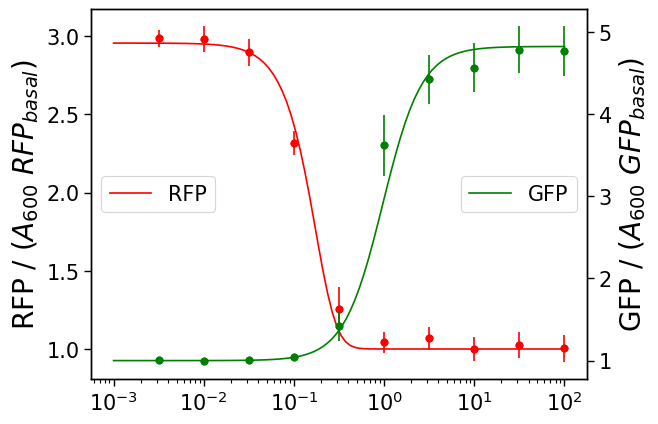

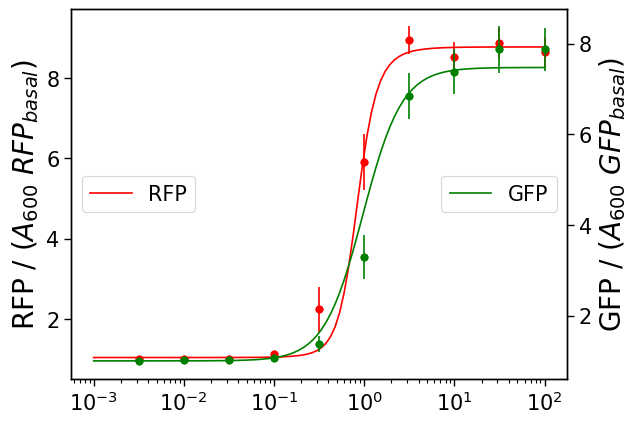

In [275]:
fluorescenceFit = steadystate(OC14data_new, *popt)
fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
gfpFit1 = fluorescenceFit[:10]; rfpFit1 = fluorescenceFit[10:20]; gfpFit3 = fluorescenceFit[20:30]; rfpFit3 = fluorescenceFit[30:40]
gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]

plotFitvsData(OC14_list1,OC14_continuous, gfpExp_list1, rfpExp_list1, semGreen1, semRed1, gfpFit1_continuous,rfpFit1_continuous)

plotFitvsData(OC14_list3,OC14_continuous, gfpExp_list3, rfpExp_list3, semGreen3, semRed3, gfpFit3_continuous,rfpFit3_continuous)
gfpFit1_continuous_copy,rfpFit1_continuous_copy, gfpFit3_continuous_copy,rfpFit3_continuous_copy = gfpFit1_continuous,rfpFit1_continuous, gfpFit3_continuous,rfpFit3_continuous 



In [276]:


sampled_parameters = np.random.multivariate_normal(popt,pcov, size=1000, check_valid='warn')#
filtered_parameters = [p for p in sampled_parameters if np.all(p>0)]
VeFixedparams =  [p for p in sampled_parameters if p[2]>2 and p[2]<9.5]


#check two requirments in comprehensive list
# filtered_parameters = [p for p in sampled_parameters if np.all(p>0) & np.all(p[2]>2 & p[2]<9.5)]
parameters_list = sampled_parameters

# [i for i in my_list if '91' not in i and '18' not in i]


In [277]:
def steadystateloss(OC14,Vc,Vd,Ve,Vf, Kvd,Kda, Kfe, Kce):

  F1 = gfp1_steadystate(OC14, Vf,Kvd)
  E1 = rfp1_steadystate(OC14,Vf,Kvd,Ve,Kfe)
  D3 = gfp3_steadystate(OC14, Vd,Kvd)
  E3 = rfp3_steadystate(OC14,  Vc, Kda,  Ve,Kce)
  # FE = np.hstack([F1,E1, D3, E3])
  FE = [F1,E1, D3, E3]

  return FE



def steadystateloss(OC14,Vc,Vd,Vf, Kvd,Kda, Kfe, Kce):

  F1 = gfp1_steadystate(OC14, Vf,Kvd)
  E1 = rfp1_steadystate(OC14,Vf,Kvd,Kfe)
  D3 = gfp3_steadystate(OC14, Vd,Kvd)
  E3 = rfp3_steadystate(OC14,  Vc, Kda,Kce)
  # FE = np.hstack([F1,E1, D3, E3])
  FE = [F1,E1, D3, E3]

  return FE



def func(p):
    loss_i = 0

    for count,OC14 in enumerate(OC14_list1):
      model= steadystateloss(OC14_list1[count],*p)

      loss_i+= ((gfpExp_list1[count] - model[0])**2 + (rfpExp_list1[count] - model[1])**2 +(gfpExp_list3[count] - model[2])**2 + (rfpExp_list3[count] - model[3])**2 )
      # loss_i+= (((gfpExp_list[count] - model[0])**2)/(semGreen.values[count]+1e-8)+ ((rfpExp_list[count] - model[1])**2)/(semRed.values[count]+1e-8))
      # loss_i+= (gfpExp_list[count] - model)**2
    
    return loss_i


lossList = []
for p in sampled_parameters:
   lossList.append(func(p))


lossFilteredParams = [p for p in parameters_list if func(p)<np.median(lossList)]
# lossFilteredParams = [p for p in parameters_list if func(p)<25]


lossList = []
for p in lossFilteredParams:
   lossList.append(func(p))



parameters_list = lossFilteredParams



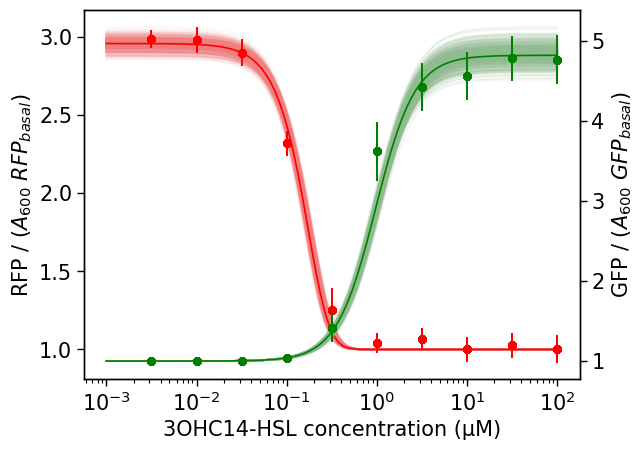

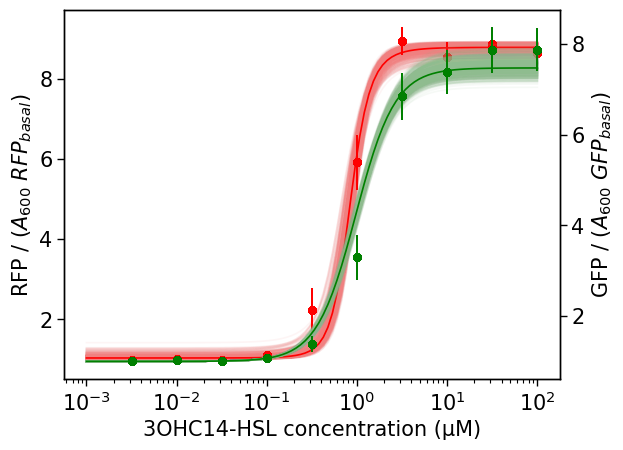

In [278]:

fig,ax = plt.subplots()
ax2=ax.twinx()
OC14_continuous = np.logspace(-3,2,100)

for p in parameters_list:
    fluorescenceFit = steadystate(OC14data_new, *p)
    fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
    fluorescenceSingleFit_continuous = steadystate(OC14data_continuous, *popt)
    gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    gfpSingleFit1_continuous = fluorescenceSingleFit_continuous[:100]; rfpSingleFit1_continuous = fluorescenceSingleFit_continuous[100:200]; gfpSingleFit3_continuous = fluorescenceSingleFit_continuous[200:300]; rfpSingleFit3_continuous = fluorescenceSingleFit_continuous[300:400]
#     steadystate(OC14_continuous, *p)
    ax2.plot(OC14_continuous, gfpFit1_continuous, c='darkseagreen', alpha=0.08)
    ax.plot(OC14_continuous, rfpFit1_continuous, c='lightcoral', alpha=0.08)
    ax2.scatter(OC14_list1,gfpExp_list1 , label='data', c='green')
    ax2.errorbar(OC14_list1,gfpExp_list1,yerr=semGreen1,c='green',fmt='o')
    ax.scatter(OC14_list1,rfpExp_list1 , label='data', c='red')
    ax.errorbar(OC14_list1,rfpExp_list1,yerr=semRed1,c='red',fmt='o')
    plt.xscale('log')

# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$',fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)',fontsize=15)
ax.plot(OC14_continuous, rfpFit1_continuous_copy, c='red', alpha=1)
ax2.plot(OC14_continuous, gfpFit1_continuous_copy, c='green', alpha=1)
plt.show()

gfpFit1_continuous_copy
fig,ax = plt.subplots()
ax2=ax.twinx()
for p in parameters_list:
    fluorescenceFit = steadystate(OC14data_new, *p)
    fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
    gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    
    ax2.plot(OC14_continuous, gfpFit3_continuous, c='darkseagreen', alpha=0.08)
    ax.plot(OC14_continuous, rfpFit3_continuous, c='lightcoral', alpha=0.08)
    ax2.scatter(OC14_list3,gfpExp_list3 , label='data', c='green')
    ax2.errorbar(OC14_list3,gfpExp_list3,yerr=semGreen3,c='green',fmt='o')
    ax.scatter(OC14_list3,rfpExp_list3 , label='data', c='red')
    ax.errorbar(OC14_list3,rfpExp_list3,yerr=semRed3,c='red',fmt='o')
    plt.xscale('log')


# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$', fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)', fontsize=15)

ax.plot(OC14_continuous, rfpFit3_continuous_copy, c='red', alpha=1)
ax2.plot(OC14_continuous, gfpFit3_continuous_copy, c='green', alpha=1)
plt.show()

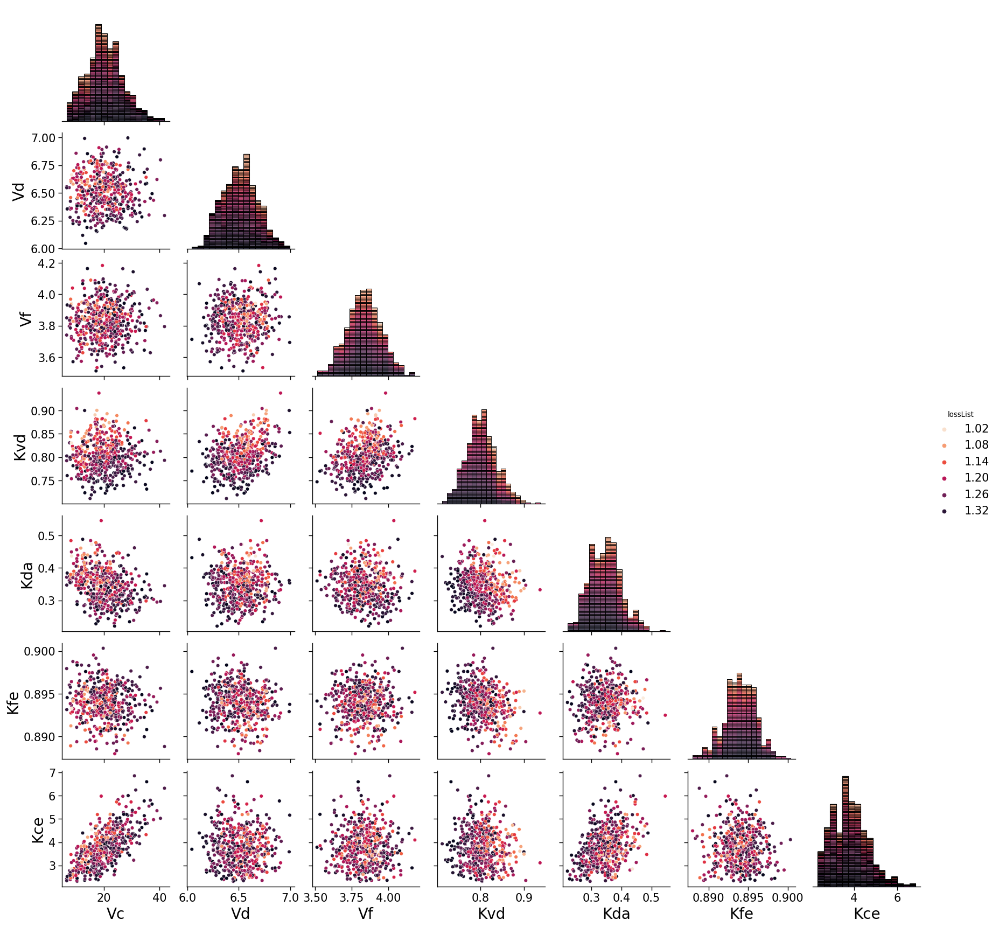

In [279]:
import pandas as pd
import seaborn as sns
sns.set_context("paper", rc={"axes.labelsize":20, "xtick.labelsize":15, "ytick.labelsize":15, "legend.fontsize":15, "axes.titlesize":20})

df = pd.DataFrame(parameters_list, columns=paramNames)
df['lossList'] = np.log(lossList)

sns.pairplot(df, hue="lossList", diag_kind='hist', diag_kws={'multiple': 'stack'},palette='rocket_r',corner=True)
plt.show()

# add extra points for convergence


0.0010      0.777043
0.0100      0.744899
0.1000      0.371438
1.0000      0.494008
10.0000     0.466651
100.0000    0.466651
0.0001      0.777043
dtype: float64 <class 'pandas.core.series.Series'>
0.0001      0.777043
0.0010      0.777043
0.0100      0.744899
0.1000      0.371438
1.0000      0.494008
10.0000     0.466651
100.0000    0.466651
dtype: float64 <class 'pandas.core.series.Series'>


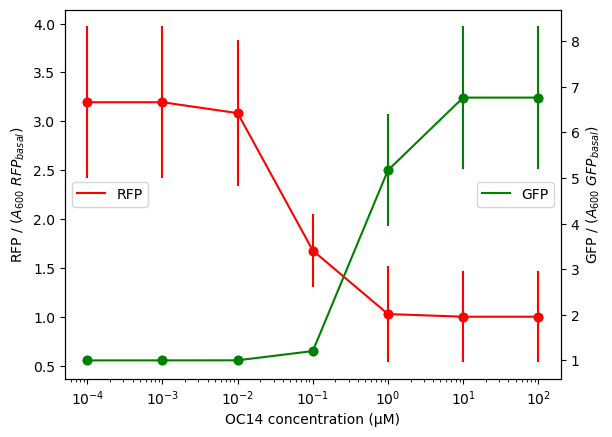

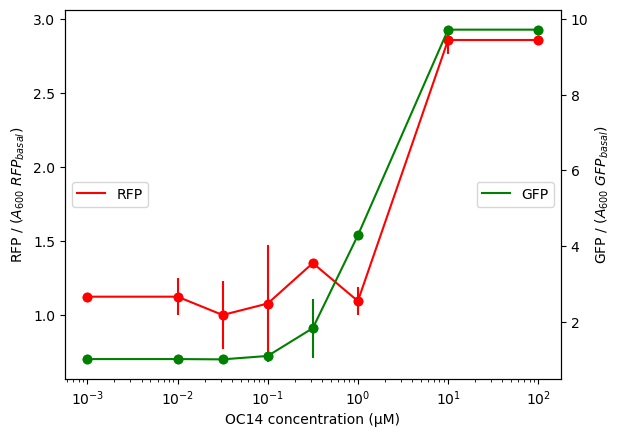

In [30]:
import pandas as pd
doseResponseExp1 = pkl.load(open('input/liquid_culture/curatedData/nonTransferred_subcircuit1_circuit14_doseResponseOC14_-0.5ATC.pkl','rb'))
OC14_list1= np.array(doseResponseExp1['OC14']); gfpExp_list1 = list(doseResponseExp1['mean_gfp']); rfpExp_list1 = list(doseResponseExp1['mean_rfp'])
semGreen1 = doseResponseExp1['std_gfp']; semRed1 = doseResponseExp1['std_rfp']
OC14_list1 = np.insert(OC14_list1, [0,len(OC14_list1)],[OC14_list1[0]*0.1, OC14_list1[-1]*10])
gfpExp_list1 = np.insert(gfpExp_list1, [0,-1],[gfpExp_list1[0], gfpExp_list1[-1]])
rfpExp_list1 = np.insert(rfpExp_list1, [0,-1],[rfpExp_list1[0], rfpExp_list1[-1]])
semRed1[semRed1.keys()[-1]*10]=semRed1.values[-1]
semRed1[semRed1.keys()[0]*0.1]=semRed1.values[0]
print(semRed1, type(semRed1))
semRed1 = pd.Series(dict(sorted(semRed1.items())))
print(semRed1,type(semRed1))

semGreen1[semGreen1.keys()[-1]*10]=semGreen1.values[-1]
semGreen1[semGreen1.keys()[0]*0.1]=semGreen1.values[0]
semGreen1 = pd.Series(dict(sorted(semGreen1.items())))

plotData(OC14_list1, rfpExp_list1, gfpExp_list1, semRed1, semGreen1)




doseResponseExp3 = pkl.load(open('input/liquid_culture/curatedData/nonTransferred_subcircuit3_circuit14_doseResponseOC14_-0.5ATC.pkl','rb'))
OC14_list3= np.array(doseResponseExp3['OC14']); gfpExp_list3 = list(doseResponseExp3['mean_gfp']); rfpExp_list3 = list(doseResponseExp3['mean_rfp'])
semGreen3 = doseResponseExp3['std_gfp']; semRed3 = doseResponseExp3['std_rfp']

OC14_list3 = np.insert(OC14_list3, [0,len(OC14_list3)],[OC14_list3[0]*0.1, OC14_list3[-1]*10])
gfpExp_list3 = np.insert(gfpExp_list3, [0,-1],[gfpExp_list3[0], gfpExp_list3[-1]])
rfpExp_list3 = np.insert(rfpExp_list3, [0,-1],[rfpExp_list3[0], rfpExp_list3[-1]])
semRed3[semRed3.keys()[-1]*10]=semRed3.values[-1]
semRed3[semRed3.keys()[0]*0.1]=semRed3.values[0]

semGreen3[semGreen3.keys()[-1]*10]=semGreen3.values[-1]
semGreen3[semGreen3.keys()[0]*0.1]=semGreen3.values[0]

plotData(OC14_list3, rfpExp_list3, gfpExp_list3, semRed3, semGreen3)


semGreen1

## combined parameters, converged dataset

In [31]:

nvd = 2
nfe = 5
nda=2
nce=3
def gfp1_steadystate(OC14, Vf,Kvd): 
# def gfp1_steadystate(OC14, Vf,Kvd, nvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    # nvd=2
    F1 = 1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return F1

def rfp1_steadystate(OC14, Vf,Kvd,VeKfenfe): 
# def rfp1_steadystate(OC14, Vf,Kvd,VeKfenfe, nvd, nfe): 
    muv = 0.0225 ; kv =  0.0183 ;
    # nvd=2;nfe=5
    
    E1 = 1 + VeKfenfe*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))))**nfe))

    return E1


def gfp3_steadystate(OC14,  Vd,Kvd): 
# def gfp3_steadystate(OC14,  Vd,Kvd, nvd): 
    # nvd=2
    muv = 0.0225 ; kv =  0.0183 ;
    D3 = 1 + Vd*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return D3

def bfp3_steadystate(D,VcKdanda): 
# def bfp3_steadystate(D,VcKdanda, nda): 
    # nda=2
    C3= 1 + VcKdanda*(1/(1+((D)**nda)))
    return C3

def rfp3_steadystate(OC14,  Vd,Kvd,VcKdanda,  VeKcence): 
# def rfp3_steadystate(OC14,  Vd,Kvd,VcKdanda,  VeKcence,nvd, nda, nce ): 
# def rfp3_steadystate(OC14,  Vd,Kvd,VeKcenceVcKdanda): 
    # muv = 0.0225 ; kv =  0.0183 ;
    E3 = 1 + VeKcence*(1/(1+((bfp3_steadystate(gfp3_steadystate(OC14,  Vd,Kvd), VcKdanda))**nce)))
    # E3 = 1 + VeKcence*(1/(1+((bfp3_steadystate(gfp3_steadystate(OC14,  Vd,Kvd, nvd), VcKdanda, nda))**nce)))
    # E3 = 1 + VeKcenceVcKdanda*(1/(1+((1 + (1/(1+((1 + Vd*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))**nda))))**nce)))
    return E3


OC14_continuous = np.logspace(-4,2, 100)


def steadystate(OC14,Vf,Vd, Kvd, VeKfenfe, VcKdanda, VeKcence):
# def steadystate(OC14,Vf,Vd, Kvd, VeKfenfe, VcKdanda, VeKcence, nvd, nfe, nda, nce):
# def steadystate(OC14,Vf,Vd, Kvd, VeKfenfe, VeKcenceVcKdanda):
  if len(OC14) == 30:
    gaps = [7,7,8,8]
  else:
        gaps = [int(len(OC14)/4)]*4
  F1 = gfp1_steadystate(OC14[:np.sum(gaps[:1])],  Vf,Kvd)
  E1 = rfp1_steadystate(OC14[np.sum(gaps[:1]):np.sum(gaps[:2])],Vf,Kvd,VeKfenfe)
  D3 = gfp3_steadystate(OC14[np.sum(gaps[:2]):np.sum(gaps[:3])], Vd,Kvd)
  E3 = rfp3_steadystate(OC14[np.sum(gaps[:3]):np.sum(gaps[:4])],  Vd,Kvd,VcKdanda,  VeKcence)

  FE = np.hstack([F1,E1, D3, E3])

  return FE


fluorescenceData = np.hstack([gfpExp_list1,rfpExp_list1, gfpExp_list3,rfpExp_list3])
OC14data_new = np.hstack([OC14_list1,OC14_list1, OC14_list3,OC14_list3])
OC14data_continuous= np.hstack([OC14_continuous,OC14_continuous, OC14_continuous,OC14_continuous])
semStacked= np.hstack([semGreen1,semRed1, semGreen3,semRed3])
print(len(fluorescenceData), len(OC14data_new), len(semStacked))
# popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,bounds = (0,10), maxfev = 100000000)
popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,sigma =semStacked, bounds = (0,10000), maxfev = 100000000)
# popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,sigma =semStacked,maxfev = 100000000)

# gfpFit, rfpFit = steadystate(OC14data_new, *popt)
# fluorescenceFit = steadystate(OC14data_new, *popt)
# fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
# paramNames = ['Vf','Vd', 'Kvd', 'VeKfenfe', 'VcKdanda', 'VeKcence', 'nvd', 'nfe', 'nda', 'nce']
paramNames = ['Vf','Vd', 'Kvd', 'VeKfenfe', 'VcKdanda', 'VeKcence']
pfitDict = {}
for param in popt:
    pfitDict[paramNames[popt.tolist().index(param)]] = param
pfitDict

30 30 30


{'Vf': 7.206760364223521,
 'Vd': 8.723741649255363,
 'Kvd': 1.0478131057590665,
 'VeKfenfe': 2.8250082740231415,
 'VcKdanda': 3.772815181358708,
 'VeKcence': 3.8123763346083237}

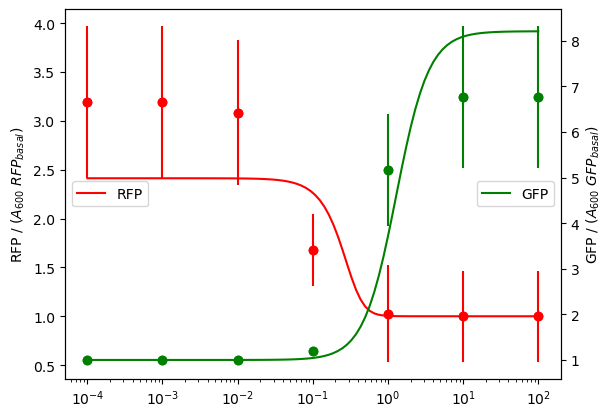

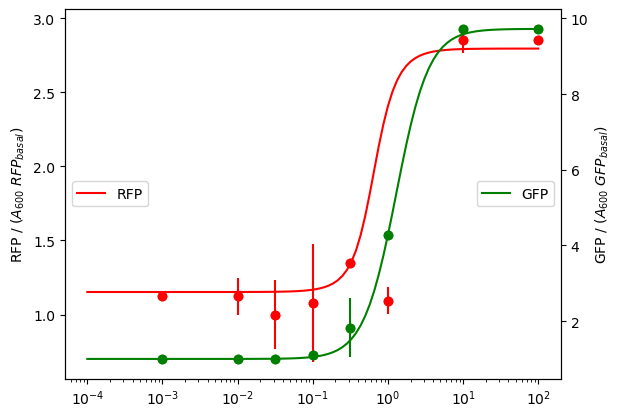

In [36]:
fluorescenceFit = steadystate(OC14data_new, *popt)
fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
gfpFit1 = fluorescenceFit[:7]; rfpFit1 = fluorescenceFit[7:14]; gfpFit3 = fluorescenceFit[14:22]; rfpFit3 = fluorescenceFit[22:30]
gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]

plotFitvsData(OC14_list1,OC14_continuous, gfpExp_list1, rfpExp_list1, semGreen1, semRed1, gfpFit1_continuous,rfpFit1_continuous)

plotFitvsData(OC14_list3,OC14_continuous, gfpExp_list3, rfpExp_list3, semGreen3, semRed3, gfpFit3_continuous,rfpFit3_continuous)
gfpFit1_continuous_copy,rfpFit1_continuous_copy, gfpFit3_continuous_copy,rfpFit3_continuous_copy = gfpFit1_continuous,rfpFit1_continuous, gfpFit3_continuous,rfpFit3_continuous 

In [38]:


sampled_parameters = np.random.multivariate_normal(popt,pcov, size=1000, check_valid='warn')#
filtered_parameters = [p for p in sampled_parameters if np.all(p>0)]



In [39]:
def steadystateloss(OC141, OC143,Vf,Vd, Kvd, VeKfenfe, VcKdanda, VeKcence):

  F1 = gfp1_steadystate(OC141,  Vf,Kvd)
  E1 = rfp1_steadystate(OC141,Vf,Kvd,VeKfenfe)
  D3 = gfp3_steadystate(OC143, Vd,Kvd)
  E3 = rfp3_steadystate(OC143,  Vd,Kvd,VcKdanda,  VeKcence)
  # FE = np.hstack([F1,E1, D3, E3])
  FE = [F1,E1, D3, E3]

  return FE

def func(p):
    loss_i = 0

    for count,OC14 in enumerate(OC14_list1):
      model= steadystateloss(OC14_list1[count],OC14_list3[count],*p)

      loss_i+= ((gfpExp_list1[count] - model[0])**2 + (rfpExp_list1[count] - model[1])**2 +(gfpExp_list3[count] - model[2])**2 + (rfpExp_list3[count] - model[3])**2 )
      # loss_i+= (((gfpExp_list[count] - model[0])**2)/(semGreen.values[count]+1e-8)+ ((rfpExp_list[count] - model[1])**2)/(semRed.values[count]+1e-8))
      # loss_i+= (gfpExp_list[count] - model)**2
    
    return loss_i

lossList = []
for p in sampled_parameters:
   lossList.append(func(p))


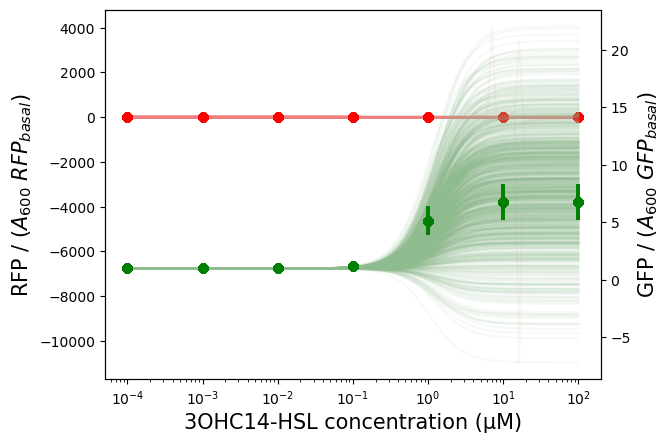

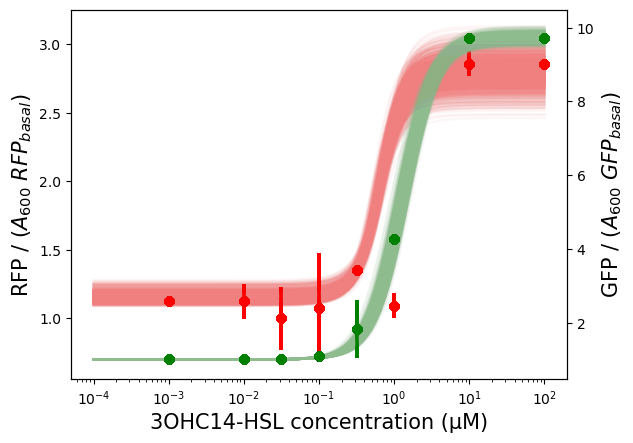

In [40]:

fig,ax = plt.subplots()
ax2=ax.twinx()
OC14_continuous = np.logspace(-4,2,100)

for p in sampled_parameters:
    fluorescenceFit = steadystate(OC14data_new, *p)
    fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
    fluorescenceSingleFit_continuous = steadystate(OC14data_continuous, *popt)
    gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    gfpSingleFit1_continuous = fluorescenceSingleFit_continuous[:100]; rfpSingleFit1_continuous = fluorescenceSingleFit_continuous[100:200]; gfpSingleFit3_continuous = fluorescenceSingleFit_continuous[200:300]; rfpSingleFit3_continuous = fluorescenceSingleFit_continuous[300:400]
#     steadystate(OC14_continuous, *p)
    ax2.plot(OC14_continuous, gfpFit1_continuous, c='darkseagreen', alpha=0.08)
    ax.plot(OC14_continuous, rfpFit1_continuous, c='lightcoral', alpha=0.08)
    ax2.scatter(OC14_list1,gfpExp_list1 , label='data', c='green')
    ax2.errorbar(OC14_list1,gfpExp_list1,yerr=semGreen1,c='green',fmt='o')
    ax.scatter(OC14_list1,rfpExp_list1 , label='data', c='red')
    ax.errorbar(OC14_list1,rfpExp_list1,yerr=semRed1,c='red',fmt='o')
    plt.xscale('log')

# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$',fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)',fontsize=15)
# ax.plot(OC14_continuous, rfpFit1_continuous_copy, c='red', alpha=1)
# ax2.plot(OC14_continuous, gfpFit1_continuous_copy, c='green', alpha=1)
plt.show()

gfpFit1_continuous_copy
fig,ax = plt.subplots()
ax2=ax.twinx()
for p in sampled_parameters:
    fluorescenceFit = steadystate(OC14data_new, *p)
    fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
    gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    
    ax2.plot(OC14_continuous, gfpFit3_continuous, c='darkseagreen', alpha=0.08)
    ax.plot(OC14_continuous, rfpFit3_continuous, c='lightcoral', alpha=0.08)
    ax2.scatter(OC14_list3,gfpExp_list3 , label='data', c='green')
    ax2.errorbar(OC14_list3,gfpExp_list3,yerr=semGreen3,c='green',fmt='o')
    ax.scatter(OC14_list3,rfpExp_list3 , label='data', c='red')
    ax.errorbar(OC14_list3,rfpExp_list3,yerr=semRed3,c='red',fmt='o')
    plt.xscale('log')


# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$', fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)', fontsize=15)

# ax.plot(OC14_continuous, rfpFit3_continuous_copy, c='red', alpha=1)
# ax2.plot(OC14_continuous, gfpFit3_continuous_copy, c='green', alpha=1)
plt.show()

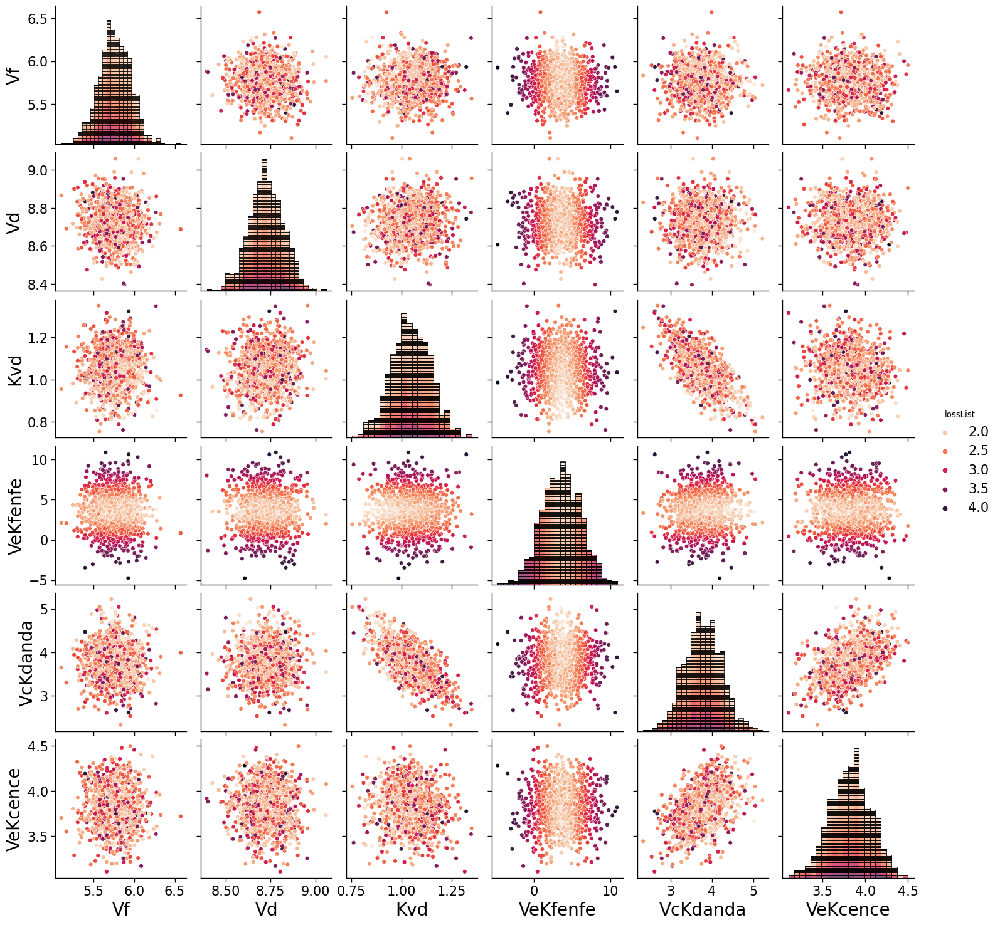

In [ ]:
import pandas as pd
import seaborn as sns
sns.set_context("paper", rc={"axes.labelsize":20, "xtick.labelsize":15, "ytick.labelsize":15, "legend.fontsize":15, "axes.titlesize":20})

paramNames = ['Vf','Vd', 'Kvd', 'VeKfenfe', 'VcKdanda', 'VeKcence']
df = pd.DataFrame(sampled_parameters, columns=paramNames)
df['lossList'] = np.log(lossList)

sns.pairplot(df, hue="lossList", diag_kind='hist', diag_kws={'multiple': 'stack'},palette='rocket_r')
# sns.pairplot(df, hue="lossList", diag_kind='hist',diag_kws=dict(hue=None, color=".2"))


## original parameters and converged dataset

0.0010      0.777043
0.0100      0.744899
0.1000      0.371438
1.0000      0.494008
10.0000     0.466651
100.0000    0.466651
0.0001      0.777043
dtype: float64 <class 'pandas.core.series.Series'>
0.0001      0.777043
0.0010      0.777043
0.0100      0.744899
0.1000      0.371438
1.0000      0.494008
10.0000     0.466651
100.0000    0.466651
dtype: float64 <class 'pandas.core.series.Series'>


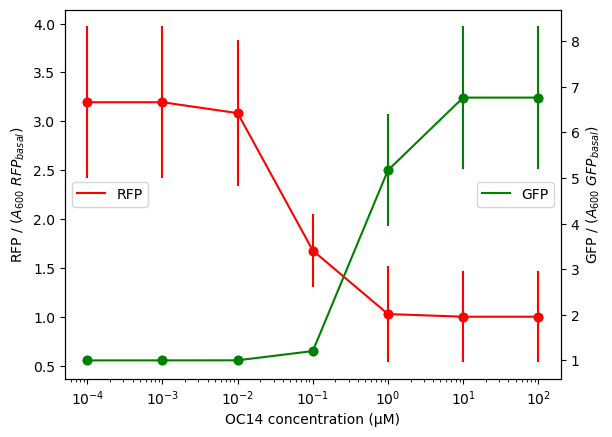

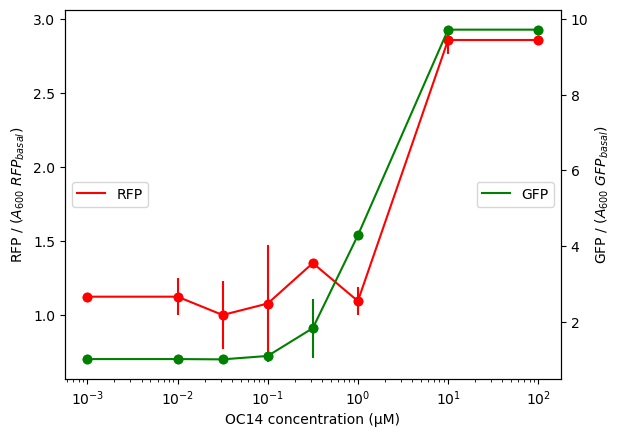

In [41]:
import pandas as pd
doseResponseExp1 = pkl.load(open('input/liquid_culture/curatedData/nonTransferred_subcircuit1_circuit14_doseResponseOC14_-0.5ATC.pkl','rb'))
OC14_list1= np.array(doseResponseExp1['OC14']); gfpExp_list1 = list(doseResponseExp1['mean_gfp']); rfpExp_list1 = list(doseResponseExp1['mean_rfp'])
semGreen1 = doseResponseExp1['std_gfp']; semRed1 = doseResponseExp1['std_rfp']
OC14_list1 = np.insert(OC14_list1, [0,len(OC14_list1)],[OC14_list1[0]*0.1, OC14_list1[-1]*10])
gfpExp_list1 = np.insert(gfpExp_list1, [0,-1],[gfpExp_list1[0], gfpExp_list1[-1]])
rfpExp_list1 = np.insert(rfpExp_list1, [0,-1],[rfpExp_list1[0], rfpExp_list1[-1]])
semRed1[semRed1.keys()[-1]*10]=semRed1.values[-1]
semRed1[semRed1.keys()[0]*0.1]=semRed1.values[0]
print(semRed1, type(semRed1))
semRed1 = pd.Series(dict(sorted(semRed1.items())))
print(semRed1,type(semRed1))

semGreen1[semGreen1.keys()[-1]*10]=semGreen1.values[-1]
semGreen1[semGreen1.keys()[0]*0.1]=semGreen1.values[0]
semGreen1 = pd.Series(dict(sorted(semGreen1.items())))

plotData(OC14_list1, rfpExp_list1, gfpExp_list1, semRed1, semGreen1)




doseResponseExp3 = pkl.load(open('input/liquid_culture/curatedData/nonTransferred_subcircuit3_circuit14_doseResponseOC14_-0.5ATC.pkl','rb'))
OC14_list3= np.array(doseResponseExp3['OC14']); gfpExp_list3 = list(doseResponseExp3['mean_gfp']); rfpExp_list3 = list(doseResponseExp3['mean_rfp'])
semGreen3 = doseResponseExp3['std_gfp']; semRed3 = doseResponseExp3['std_rfp']

OC14_list3 = np.insert(OC14_list3, [0,len(OC14_list3)],[OC14_list3[0]*0.1, OC14_list3[-1]*10])
gfpExp_list3 = np.insert(gfpExp_list3, [0,-1],[gfpExp_list3[0], gfpExp_list3[-1]])
rfpExp_list3 = np.insert(rfpExp_list3, [0,-1],[rfpExp_list3[0], rfpExp_list3[-1]])
semRed3[semRed3.keys()[-1]*10]=semRed3.values[-1]
semRed3[semRed3.keys()[0]*0.1]=semRed3.values[0]

semGreen3[semGreen3.keys()[-1]*10]=semGreen3.values[-1]
semGreen3[semGreen3.keys()[0]*0.1]=semGreen3.values[0]

plotData(OC14_list3, rfpExp_list3, gfpExp_list3, semRed3, semGreen3)


In [42]:
nvd = 2
nfe = 5
nda=2
nce=3
def gfp1_steadystate(OC14, Vf,Kvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    # nvd=2
    F1 = 1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return F1

def rfp1_steadystate(OC14, Vf,Kvd,Ve,Kfe): 
    muv = 0.0225 ; kv =  0.0183 ;
    # nvd=2;nfe=5
    
    E1 = 1 + Ve*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))/(Kfe+1e-8))**nfe))

    return E1


def gfp3_steadystate(OC14,  Vd,Kvd): 
    # nvd=2
    muv = 0.0225 ; kv =  0.0183 ;
    D3 = 1 + Vd*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return D3

def bfp3_steadystate(D,Vc,Kda): 
    # nda=2
    C3= 1 + Vc*(1/(1+((D/(Kda+1e-8))**nda)))
    return C3

def rfp3_steadystate(OC14,  Vd,Kvd,Vc, Kda,  Ve,Kce): 
    # nce=3
    E3 = 1 + Ve*(1/(1+((bfp3_steadystate(gfp3_steadystate(OC14,  Vd,Kvd), Vc, Kda)/(Kce+1e-8))**nce)))
    return E3


OC14_continuous = np.logspace(-4,2, 100)
def steadystate(OC14,Vc, Vd, Ve, Vf, Kvd, Kda, Kce, Kfe):
# def steadystate(OC14,Vf,Vd, Kvd, VeKfenfe, VcKdanda, VeKcence, nvd, nfe, nda, nce):
# def steadystate(OC14,Vf,Vd, Kvd, VeKfenfe, VeKcenceVcKdanda):
  if len(OC14) == 30:
    gaps = [7,7,8,8]
  else:
        gaps = [int(len(OC14)/4)]*4
  F1 = gfp1_steadystate(OC14[:np.sum(gaps[:1])],  Vf,Kvd)
  E1 = rfp1_steadystate(OC14[np.sum(gaps[:1]):np.sum(gaps[:2])],Vf,Kvd,Ve,Kfe)
  D3 = gfp3_steadystate(OC14[np.sum(gaps[:2]):np.sum(gaps[:3])],Vd,Kvd)
  E3 = rfp3_steadystate(OC14[np.sum(gaps[:3]):np.sum(gaps[:4])],   Vd,Kvd,Vc, Kda,  Ve,Kce)

  FE = np.hstack([F1,E1, D3, E3])

  return FE




fluorescenceData = np.hstack([gfpExp_list1,rfpExp_list1, gfpExp_list3,rfpExp_list3])
OC14data_new = np.hstack([OC14_list1,OC14_list1, OC14_list3,OC14_list3])
OC14data_continuous= np.hstack([OC14_continuous,OC14_continuous, OC14_continuous,OC14_continuous])
semStacked= np.hstack([semGreen1,semRed1, semGreen3,semRed3])

print(len(OC14data_new), len(fluorescenceData), len(semStacked))
# popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,bounds = (0,10), maxfev = 100000000)
popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,sigma =semStacked,bounds = (0,100), maxfev = 100000000)

# gfpFit, rfpFit = steadystate(OC14data_new, *popt)
# fluorescenceFit = steadystate(OC14data_new, *popt)
# fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
paramNames = ['Vc', 'Vd', 'Ve', 'Vf', 'Kvd', 'Kda', 'Kce', 'Kfe']
pfitDict = {}
for param in popt:
    pfitDict[paramNames[popt.tolist().index(param)]] = param
pfitDict

30 30 30


{'Vc': 99.99965767652348,
 'Vd': 8.723396422480807,
 'Ve': 99.99999419704386,
 'Vf': 7.283221615836376,
 'Kvd': 1.022285238440749,
 'Kda': 10.588075976666014,
 'Kce': 14.731786758148315,
 'Kfe': 0.43480003202141526}

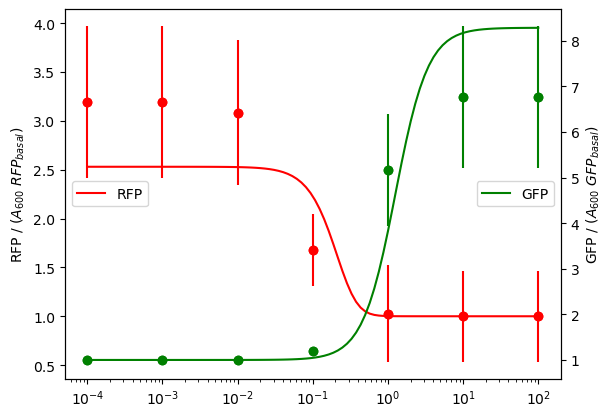

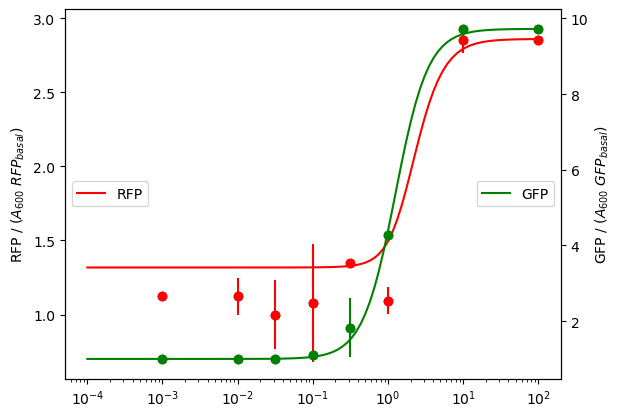

In [47]:
fluorescenceFit = steadystate(OC14data_new, *popt)
fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
gfpFit1 = fluorescenceFit[:7]; rfpFit1 = fluorescenceFit[7:14]; gfpFit3 = fluorescenceFit[14:22]; rfpFit3 = fluorescenceFit[22:30]
gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]

plotFitvsData(OC14_list1,OC14_continuous, gfpExp_list1, rfpExp_list1, semGreen1, semRed1, gfpFit1_continuous,rfpFit1_continuous)

plotFitvsData(OC14_list3,OC14_continuous, gfpExp_list3, rfpExp_list3, semGreen3, semRed3, gfpFit3_continuous,rfpFit3_continuous)
gfpFit1_continuous_copy,rfpFit1_continuous_copy, gfpFit3_continuous_copy,rfpFit3_continuous_copy = gfpFit1_continuous,rfpFit1_continuous, gfpFit3_continuous,rfpFit3_continuous 

In [48]:


sampled_parameters = np.random.multivariate_normal(popt,pcov, size=1000, check_valid='warn')#
filtered_parameters = [p for p in sampled_parameters if np.all(p>0)]



/var/folders/bt/1cqt3cks1sl9cz4dfwlyxhpm0000gn/T/ipykernel_1181/2144725627.py:1: RuntimeWarning: covariance is not positive-semidefinite.
  sampled_parameters = np.random.multivariate_normal(popt,pcov, size=1000, check_valid='warn')#


In [49]:
def steadystateloss(OC141, OC143,Vc, Vd, Ve, Vf, Kvd, Kda, Kce, Kfe):

  F1 = gfp1_steadystate(OC141,  Vf,Kvd)
  E1 = rfp1_steadystate(OC141,Vf,Kvd,Ve, Kfe)
  D3 = gfp3_steadystate(OC143, Vd,Kvd)
  E3 = rfp3_steadystate(OC143,  Vd,Kvd,Vc,Kda,  Ve,Kce)
  # FE = np.hstack([F1,E1, D3, E3])
  FE = [F1,E1, D3, E3]

  return FE

def func(p):
    loss_i = 0

    for count,OC14 in enumerate(OC14_list1):
      model= steadystateloss(OC14_list1[count],OC14_list3[count],*p)

      loss_i+= ((gfpExp_list1[count] - model[0])**2 + (rfpExp_list1[count] - model[1])**2 +(gfpExp_list3[count] - model[2])**2 + (rfpExp_list3[count] - model[3])**2 )
      # loss_i+= (((gfpExp_list[count] - model[0])**2)/(semGreen.values[count]+1e-8)+ ((rfpExp_list[count] - model[1])**2)/(semRed.values[count]+1e-8))
      # loss_i+= (gfpExp_list[count] - model)**2
    
    return loss_i

lossList = []
for p in sampled_parameters:
   lossList.append(func(p))


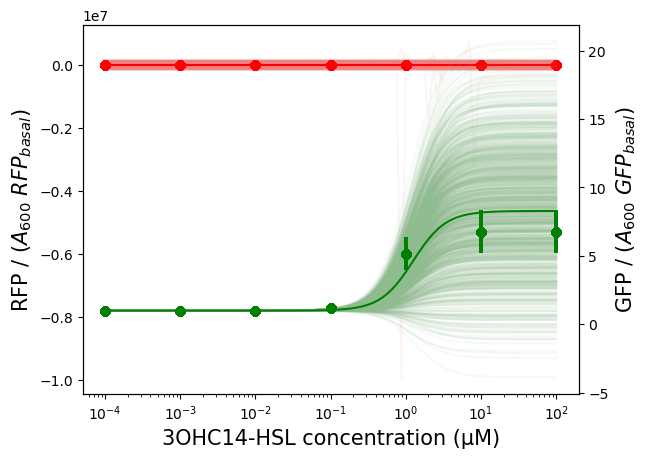

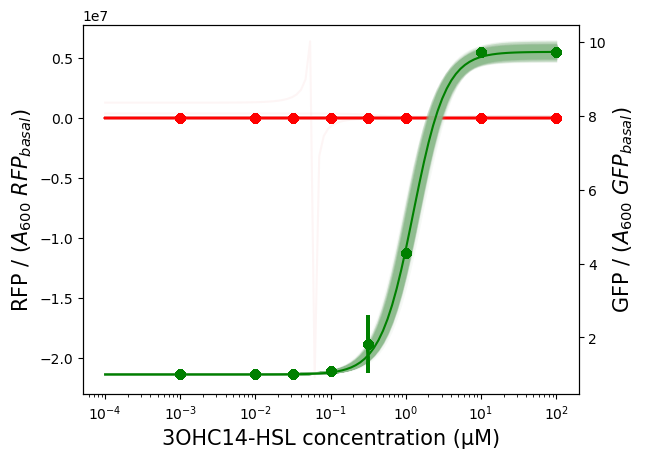

In [51]:

fig,ax = plt.subplots()
ax2=ax.twinx()
OC14_continuous = np.logspace(-4,2,100)

for p in sampled_parameters:
    fluorescenceFit = steadystate(OC14data_new, *p)
    fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
    fluorescenceSingleFit_continuous = steadystate(OC14data_continuous, *popt)
    gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    gfpSingleFit1_continuous = fluorescenceSingleFit_continuous[:100]; rfpSingleFit1_continuous = fluorescenceSingleFit_continuous[100:200]; gfpSingleFit3_continuous = fluorescenceSingleFit_continuous[200:300]; rfpSingleFit3_continuous = fluorescenceSingleFit_continuous[300:400]
#     steadystate(OC14_continuous, *p)
    ax2.plot(OC14_continuous, gfpFit1_continuous, c='darkseagreen', alpha=0.08)
    ax.plot(OC14_continuous, rfpFit1_continuous, c='lightcoral', alpha=0.08)
    ax2.scatter(OC14_list1,gfpExp_list1 , label='data', c='green')
    ax2.errorbar(OC14_list1,gfpExp_list1,yerr=semGreen1,c='green',fmt='o')
    ax.scatter(OC14_list1,rfpExp_list1 , label='data', c='red')
    ax.errorbar(OC14_list1,rfpExp_list1,yerr=semRed1,c='red',fmt='o')
    plt.xscale('log')

# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$',fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)',fontsize=15)
ax.plot(OC14_continuous, rfpFit1_continuous_copy, c='red', alpha=1)
ax2.plot(OC14_continuous, gfpFit1_continuous_copy, c='green', alpha=1)
plt.show()

gfpFit1_continuous_copy
fig,ax = plt.subplots()
ax2=ax.twinx()
for p in sampled_parameters:
    fluorescenceFit = steadystate(OC14data_new, *p)
    fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
    gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    
    ax2.plot(OC14_continuous, gfpFit3_continuous, c='darkseagreen', alpha=0.08)
    ax.plot(OC14_continuous, rfpFit3_continuous, c='lightcoral', alpha=0.08)
    ax2.scatter(OC14_list3,gfpExp_list3 , label='data', c='green')
    ax2.errorbar(OC14_list3,gfpExp_list3,yerr=semGreen3,c='green',fmt='o')
    ax.scatter(OC14_list3,rfpExp_list3 , label='data', c='red')
    ax.errorbar(OC14_list3,rfpExp_list3,yerr=semRed3,c='red',fmt='o')
    plt.xscale('log')


# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$', fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)', fontsize=15)

ax.plot(OC14_continuous, rfpFit3_continuous_copy, c='red', alpha=1)
ax2.plot(OC14_continuous, gfpFit3_continuous_copy, c='green', alpha=1)
plt.show()

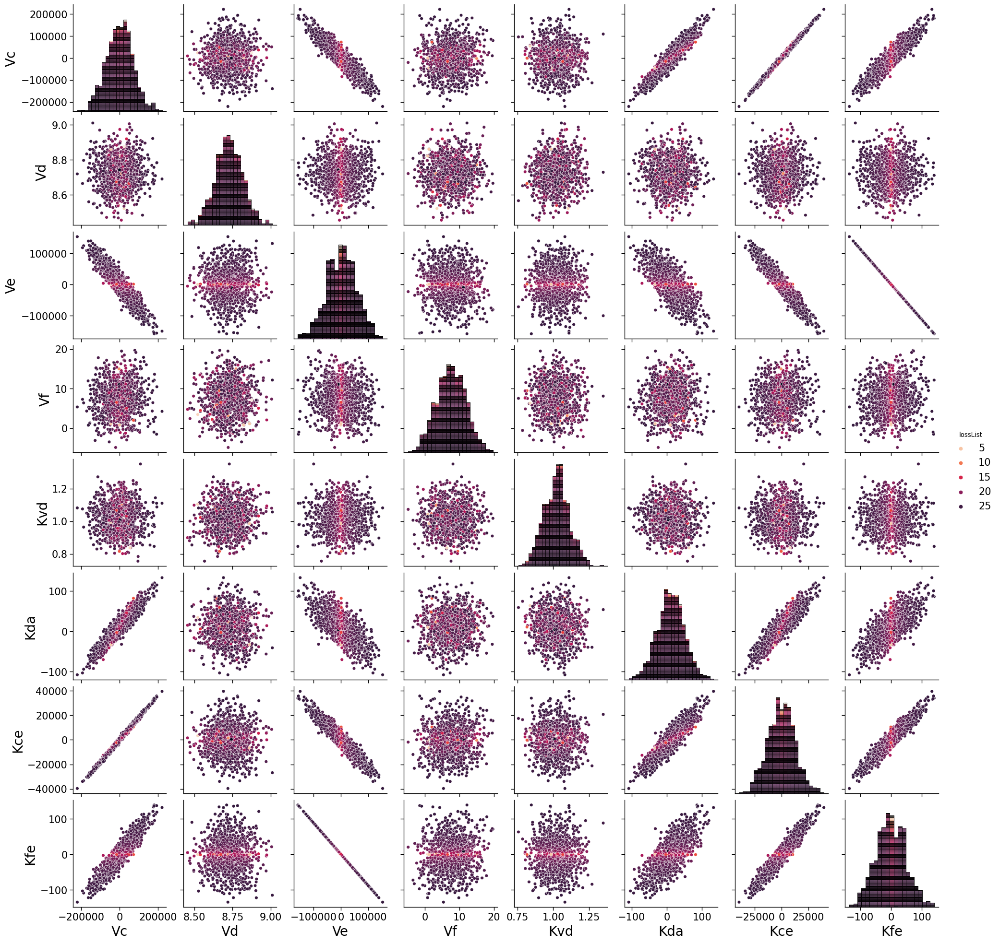

In [52]:
import pandas as pd
import seaborn as sns
sns.set_context("paper", rc={"axes.labelsize":20, "xtick.labelsize":15, "ytick.labelsize":15, "legend.fontsize":15, "axes.titlesize":20})

df = pd.DataFrame(sampled_parameters, columns=paramNames)
df['lossList'] = np.log(lossList)

sns.pairplot(df, hue="lossList", diag_kind='hist', diag_kws={'multiple': 'stack'},palette='rocket_r')
# sns.pairplot(df, hue="lossList", diag_kind='hist',diag_kws=dict(hue=None, color=".2"))


## nodeA combined parameters and converged dataset

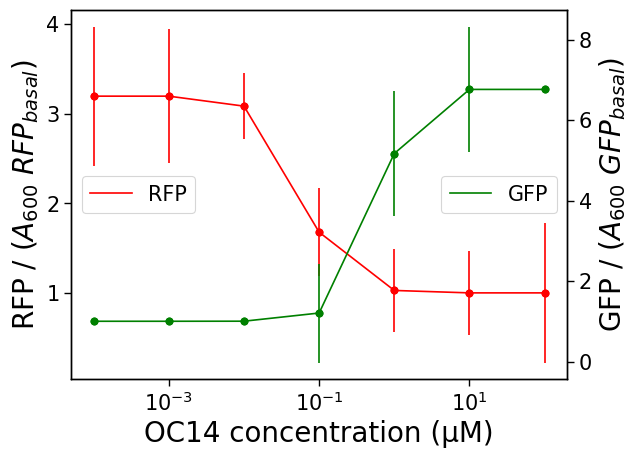

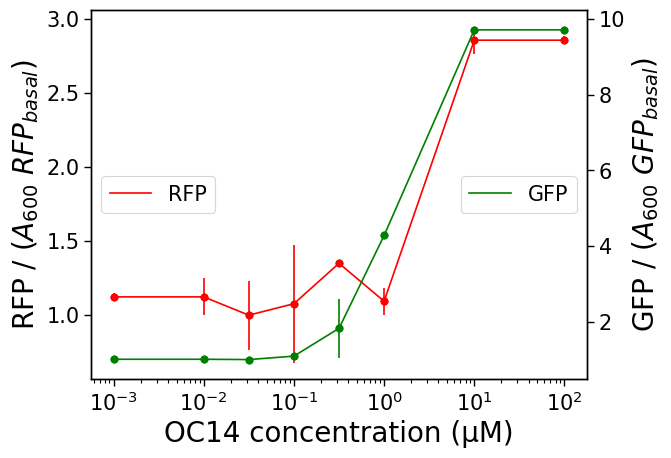

In [339]:
doseResponseExp1 = pkl.load(open('input/liquid_culture/curatedData/nonTransferred_subcircuit1_circuit14_doseResponseOC14_-0.5ATC.pkl','rb'))
OC14_list1= np.array(doseResponseExp1['OC14']); gfpExp_list1 = list(doseResponseExp1['mean_gfp']); rfpExp_list1 = list(doseResponseExp1['mean_rfp'])
semGreen1 = doseResponseExp1['std_gfp']; semRed1 = doseResponseExp1['std_rfp']
OC14_list1 = np.insert(OC14_list1, [0,len(OC14_list1)],[OC14_list1[0]*0.1, OC14_list1[-1]*10])
gfpExp_list1 = np.insert(gfpExp_list1, [0,-1],[gfpExp_list1[0], gfpExp_list1[-1]])
rfpExp_list1 = np.insert(rfpExp_list1, [0,-1],[rfpExp_list1[0], rfpExp_list1[-1]])
semRed1[semRed1.keys()[-1]*10]=semRed1.values[-1]
semRed1[semRed1.keys()[0]*0.1]=semRed1.values[0]

semGreen1[semGreen1.keys()[-1]*10]=semGreen1.values[-1]
semGreen1[semGreen1.keys()[0]*0.1]=semGreen1.values[0]


plotData(OC14_list1, rfpExp_list1, gfpExp_list1, semRed1, semGreen1)




doseResponseExp3 = pkl.load(open('input/liquid_culture/curatedData/nonTransferred_subcircuit3_circuit14_doseResponseOC14_-0.5ATC.pkl','rb'))
OC14_list3= np.array(doseResponseExp3['OC14']); gfpExp_list3 = list(doseResponseExp3['mean_gfp']); rfpExp_list3 = list(doseResponseExp3['mean_rfp'])
semGreen3 = doseResponseExp3['std_gfp']; semRed3 = doseResponseExp3['std_rfp']

OC14_list3 = np.insert(OC14_list3, [0,len(OC14_list3)],[OC14_list3[0]*0.1, OC14_list3[-1]*10])
gfpExp_list3 = np.insert(gfpExp_list3, [0,-1],[gfpExp_list3[0], gfpExp_list3[-1]])
rfpExp_list3 = np.insert(rfpExp_list3, [0,-1],[rfpExp_list3[0], rfpExp_list3[-1]])
semRed3[semRed3.keys()[-1]*10]=semRed3.values[-1]
semRed3[semRed3.keys()[0]*0.1]=semRed3.values[0]

semGreen3[semGreen3.keys()[-1]*10]=semGreen3.values[-1]
semGreen3[semGreen3.keys()[0]*0.1]=semGreen3.values[0]

plotData(OC14_list3, rfpExp_list3, gfpExp_list3, semRed3, semGreen3)


In [340]:
nvd = 2
nfe = 5
nda=2
nce=3
def gfp1_steadystate(OC14, Vf,Kvd): 
    muv = 0.0225 ; kv =  0.0183 ;
    # nvd=2
    F1 = 1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return F1

def rfp1_steadystate(OC14, Vf,Kvd,Ve,Kfe): 
    muv = 0.0225 ; kv =  0.0183 ;
    # nvd=2;nfe=5
    
    E1 = 1 + Ve*(1/(1+((1 + Vf*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd )))/(Kfe+1e-8))**nfe))

    return E1


def gfp3_steadystate(OC14,  Vd,Kvd): 
    # nvd=2
    muv = 0.0225 ; kv =  0.0183 ;
    D3 = 1 + Vd*(1/(1+((muv*Kvd)/(kv*OC14 + 1e-8))**nvd ))
    return D3

def bfp3_steadystate(D,Vc,Kda): 
    # nda=2
    C3= 1 + Vc*(1/(1+((D/(Kda+1e-8))**nda)))
    return C3

def rfp3_steadystate(OC14,  Vd,Kvd,Vc, Kda,  Ve,Kce): 
    # nce=3
    E3 = 1 + Ve*(1/(1+((bfp3_steadystate(gfp3_steadystate(OC14,  Vd,Kvd), Vc, Kda)/(Kce+1e-8))**nce)))
    return E3


OC14_continuous = np.logspace(-4,2, 100)
def steadystate(OC14,Vc, Vd, Ve, Vf, Kvd, Kda, Kce, Kfe):
# def steadystate(OC14,Vf,Vd, Kvd, VeKfenfe, VcKdanda, VeKcence, nvd, nfe, nda, nce):
# def steadystate(OC14,Vf,Vd, Kvd, VeKfenfe, VeKcenceVcKdanda):
  if len(OC14) == 30:
    gaps = [7,7,8,8]
  else:
        gaps = [int(len(OC14)/4)]*4
  F1 = gfp1_steadystate(OC14[:np.sum(gaps[:1])],  Vf,Kvd)
  E1 = rfp1_steadystate(OC14[np.sum(gaps[:1]):np.sum(gaps[:2])],Vf,Kvd,Ve,Kfe)
  D3 = gfp3_steadystate(OC14[np.sum(gaps[:2]):np.sum(gaps[:3])],Vd,Kvd)
  E3 = rfp3_steadystate(OC14[np.sum(gaps[:3]):np.sum(gaps[:4])],   Vd,Kvd,Vc, Kda,  Ve,Kce)

  FE = np.hstack([F1,E1, D3, E3])

  return FE




fluorescenceData = np.hstack([gfpExp_list1,rfpExp_list1, gfpExp_list3,rfpExp_list3])
OC14data_new = np.hstack([OC14_list1,OC14_list1, OC14_list3,OC14_list3])
OC14data_continuous= np.hstack([OC14_continuous,OC14_continuous, OC14_continuous,OC14_continuous])
semStacked= np.hstack([semGreen1,semRed1, semGreen3,semRed3])

print(len(OC14data_new), len(fluorescenceData), len(semStacked))
# popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,bounds = (0,10), maxfev = 100000000)
popt, pcov = curve_fit(f=steadystate, xdata=OC14data_new, ydata=fluorescenceData ,sigma =semStacked,bounds = (0,100), maxfev = 100000000)

# gfpFit, rfpFit = steadystate(OC14data_new, *popt)
# fluorescenceFit = steadystate(OC14data_new, *popt)
# fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
paramNames = ['Vc', 'Vd', 'Ve', 'Vf', 'Kvd', 'Kda', 'Kce', 'Kfe']
pfitDict = {}
for param in popt:
    pfitDict[paramNames[popt.tolist().index(param)]] = param
pfitDict

30 30 30


{'Vc': 99.99967506555454,
 'Vd': 8.723982249168216,
 'Ve': 99.9999965963745,
 'Vf': 5.763597511095369,
 'Kvd': 1.0274718645062577,
 'Kda': 10.590165807983256,
 'Kce': 14.73381435068223,
 'Kfe': 0.45145204287506635}

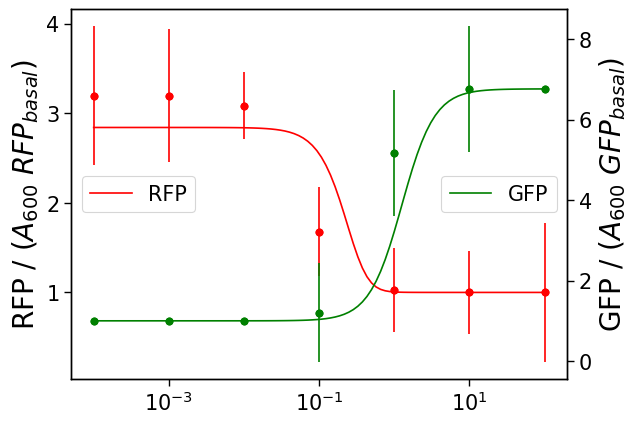

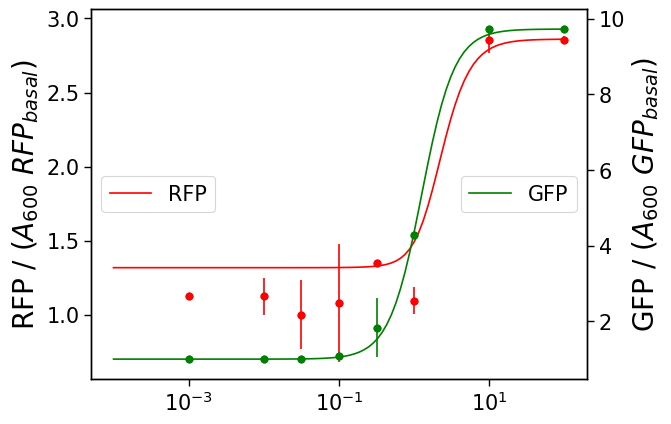

In [ ]:
fluorescenceFit = steadystate(OC14data_new, *popt)
fluorescenceFit_continuous = steadystate(OC14data_continuous, *popt)
gfpFit1 = fluorescenceFit[:7]; rfpFit1 = fluorescenceFit[7:14]; gfpFit3 = fluorescenceFit[14:22]; rfpFit3 = fluorescenceFit[22:30]
gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]

plotFitvsData(OC14_list1,OC14_continuous, gfpExp_list1, rfpExp_list1, semGreen1, semRed1, gfpFit1_continuous,rfpFit1_continuous)

plotFitvsData(OC14_list3,OC14_continuous, gfpExp_list3, rfpExp_list3, semGreen3, semRed3, gfpFit3_continuous,rfpFit3_continuous)
# gfpFit1_continuous_copy,rfpFit1_continuous_copy, gfpFit3_continuous_copy,rfpFit3_continuous_copy = gfpFit1_continuous,rfpFit1_continuous, gfpFit3_continuous,rfpFit3_continuous 

In [ ]:


sampled_parameters = np.random.multivariate_normal(popt,pcov, size=1000, check_valid='warn')#
filtered_parameters = [p for p in sampled_parameters if np.all(p>0)]



/var/folders/bt/1cqt3cks1sl9cz4dfwlyxhpm0000gn/T/ipykernel_2997/2859426649.py:1: RuntimeWarning: covariance is not positive-semidefinite.
  sampled_parameters = np.random.multivariate_normal(popt,pcov, size=100, check_valid='warn')#


In [ ]:
def steadystateloss(OC141, OC143,Vc, Vd, Ve, Vf, Kvd, Kda, Kce, Kfe):

  F1 = gfp1_steadystate(OC141,  Vf,Kvd)
  E1 = rfp1_steadystate(OC141,Vf,Kvd,Ve, Kfe)
  D3 = gfp3_steadystate(OC143, Vd,Kvd)
  E3 = rfp3_steadystate(OC143,  Vd,Kvd,Vc,Kda,  Ve,Kce)
  # FE = np.hstack([F1,E1, D3, E3])
  FE = [F1,E1, D3, E3]

  return FE

def func(p):
    loss_i = 0

    for count,OC14 in enumerate(OC14_list1):
      model= steadystateloss(OC14_list1[count],OC14_list3[count],*p)

      loss_i+= ((gfpExp_list1[count] - model[0])**2 + (rfpExp_list1[count] - model[1])**2 +(gfpExp_list3[count] - model[2])**2 + (rfpExp_list3[count] - model[3])**2 )
      # loss_i+= (((gfpExp_list[count] - model[0])**2)/(semGreen.values[count]+1e-8)+ ((rfpExp_list[count] - model[1])**2)/(semRed.values[count]+1e-8))
      # loss_i+= (gfpExp_list[count] - model)**2
    
    return loss_i

lossList = []
for p in sampled_parameters:
   lossList.append(func(p))


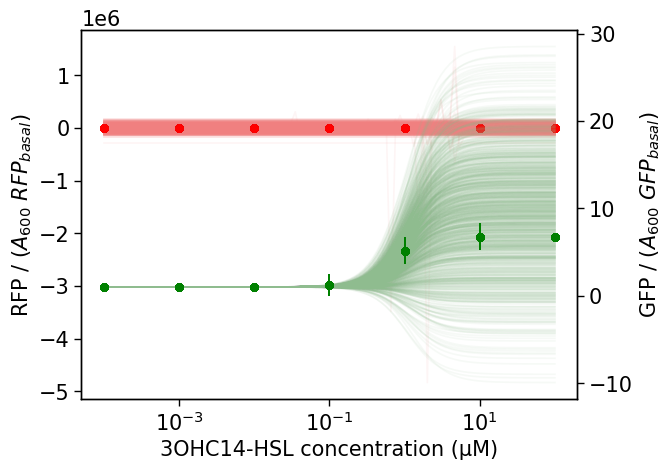

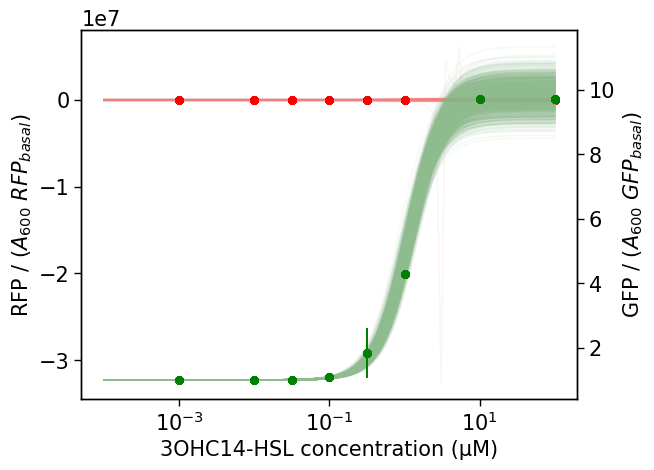

In [ ]:

fig,ax = plt.subplots()
ax2=ax.twinx()
OC14_continuous = np.logspace(-4,2,100)

for p in sampled_parameters:
    fluorescenceFit = steadystate(OC14data_new, *p)
    fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
    fluorescenceSingleFit_continuous = steadystate(OC14data_continuous, *popt)
    gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    gfpSingleFit1_continuous = fluorescenceSingleFit_continuous[:100]; rfpSingleFit1_continuous = fluorescenceSingleFit_continuous[100:200]; gfpSingleFit3_continuous = fluorescenceSingleFit_continuous[200:300]; rfpSingleFit3_continuous = fluorescenceSingleFit_continuous[300:400]
#     steadystate(OC14_continuous, *p)
    ax2.plot(OC14_continuous, gfpFit1_continuous, c='darkseagreen', alpha=0.08)
    ax.plot(OC14_continuous, rfpFit1_continuous, c='lightcoral', alpha=0.08)
    ax2.scatter(OC14_list1,gfpExp_list1 , label='data', c='green')
    ax2.errorbar(OC14_list1,gfpExp_list1,yerr=semGreen1,c='green',fmt='o')
    ax.scatter(OC14_list1,rfpExp_list1 , label='data', c='red')
    ax.errorbar(OC14_list1,rfpExp_list1,yerr=semRed1,c='red',fmt='o')
    plt.xscale('log')

# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$',fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)',fontsize=15)
# ax.plot(OC14_continuous, rfpFit1_continuous_copy, c='red', alpha=1)
# ax2.plot(OC14_continuous, gfpFit1_continuous_copy, c='green', alpha=1)
plt.show()

gfpFit1_continuous_copy
fig,ax = plt.subplots()
ax2=ax.twinx()
for p in sampled_parameters:
    fluorescenceFit = steadystate(OC14data_new, *p)
    fluorescenceFit_continuous = steadystate(OC14data_continuous, *p)
    gfpFit1 = fluorescenceFit[:5]; rfpFit1 = fluorescenceFit[5:10]; gfpFit3 = fluorescenceFit[10:16]; rfpFit3 = fluorescenceFit[16:22]
    gfpFit1_continuous = fluorescenceFit_continuous[:100]; rfpFit1_continuous = fluorescenceFit_continuous[100:200]; gfpFit3_continuous = fluorescenceFit_continuous[200:300]; rfpFit3_continuous = fluorescenceFit_continuous[300:400]
    
    ax2.plot(OC14_continuous, gfpFit3_continuous, c='darkseagreen', alpha=0.08)
    ax.plot(OC14_continuous, rfpFit3_continuous, c='lightcoral', alpha=0.08)
    ax2.scatter(OC14_list3,gfpExp_list3 , label='data', c='green')
    ax2.errorbar(OC14_list3,gfpExp_list3,yerr=semGreen3,c='green',fmt='o')
    ax.scatter(OC14_list3,rfpExp_list3 , label='data', c='red')
    ax.errorbar(OC14_list3,rfpExp_list3,yerr=semRed3,c='red',fmt='o')
    plt.xscale('log')


# ax.legend(loc='center left') #upper right
ax.set_ylabel('RFP / ($A_{600}$ $RFP_{basal})$', fontsize=15)
ax.set_xscale('log')
# ax2.legend(loc='center right') #upper left
ax2.set_ylabel('GFP / ($A_{600}$ $GFP_{basal})$', fontsize=15)
ax.set_xscale('log')
ax.set_xlabel(f'3OHC14-HSL concentration (µM)', fontsize=15)

# ax.plot(OC14_continuous, rfpFit3_continuous_copy, c='red', alpha=1)
# ax2.plot(OC14_continuous, gfpFit3_continuous_copy, c='green', alpha=1)
plt.show()

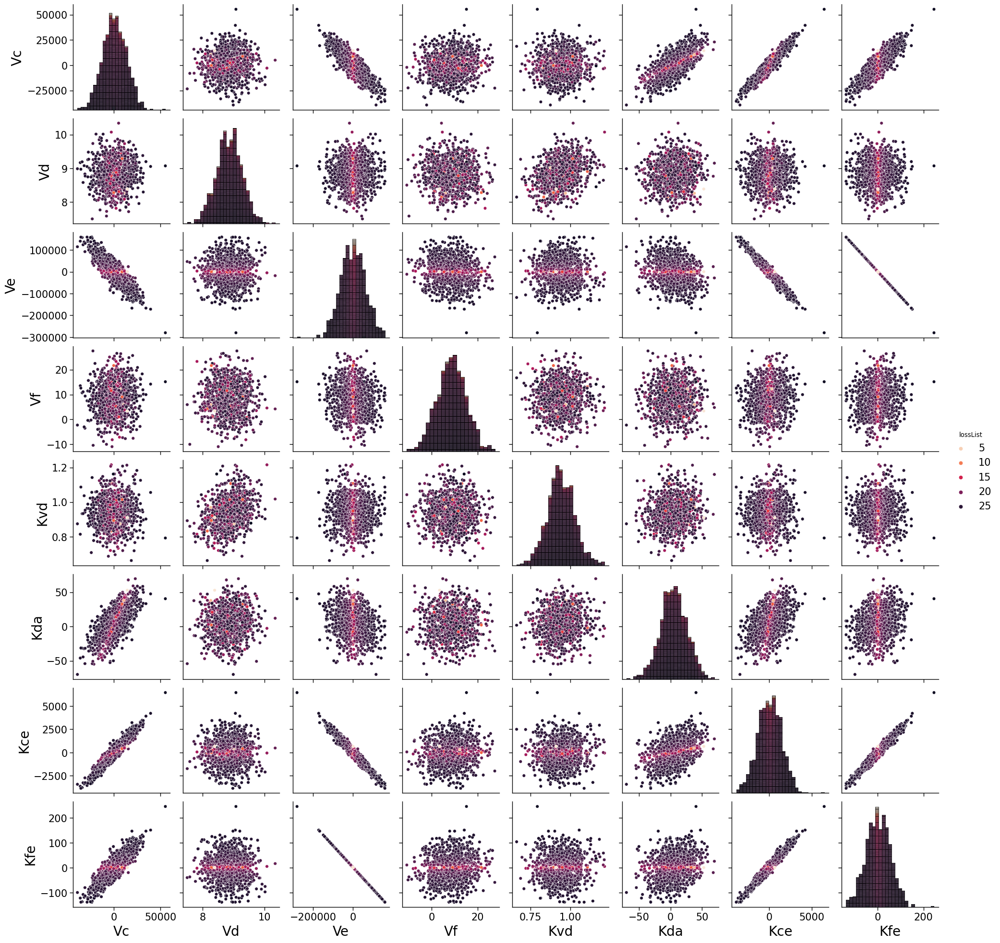

In [ ]:
import pandas as pd
import seaborn as sns
sns.set_context("paper", rc={"axes.labelsize":20, "xtick.labelsize":15, "ytick.labelsize":15, "legend.fontsize":15, "axes.titlesize":20})

df = pd.DataFrame(sampled_parameters, columns=paramNames)
df['lossList'] = np.log(lossList)

sns.pairplot(df, hue="lossList", diag_kind='hist', diag_kws={'multiple': 'stack'},palette='rocket_r')
# sns.pairplot(df, hue="lossList", diag_kind='hist',diag_kws=dict(hue=None, color=".2"))


## Generate parameter set

In [ ]:
#############
###paths#####
#############
import sys
import os




pwd = os.getcwd()
modellingpath = pwd.rpartition("modelling")[0] + pwd.rpartition("modelling")[1]
sys.path.append(modellingpath + '/lib')
#############
from equations.parameterCreation_functions import *
#############
import numpy as np
import pandas as pd
import pickle as pkl
# %matplotlib inline
circuit_n=14
variant='fitted0'
#diffusion parameters


#maximum production parameters (V*)
# V* = V/b
# V = 10-1000
# b=0.1-1
minV = 10;maxV=1000;minb=0.1;maxb=1
Va = {'name':'Va','distribution':'loguniform', 'min':minV/maxb, 'max':maxV/minb}
Vb = {'name':'Vb','distribution':'loguniform', 'min':minV/maxb, 'max':maxV/minb}

Vc = {'name':'Vc','distribution':'gaussian', 'mean':pfitDict['Vc'], 'noisetosignal':0.3}
Vd = {'name':'Vd','distribution':'gaussian', 'mean':pfitDict['Vd'], 'noisetosignal':0.3}
Ve = {'name':'Ve','distribution':'gaussian', 'mean':pfitDict['Ve'], 'noisetosignal':0.3}
Vf = {'name':'Vf','distribution':'gaussian', 'mean':pfitDict['Vf'], 'noisetosignal':0.3}

V_parameters = [Va,Vb, Vc, Vd, Ve, Vf]



K1=0.0183; K2=0.0183
DUmin=0.1; DUmax=10; DVmin=0.1; DVmax=10
muU=0.0225; muV=0.0225
KdiffpromMin=0.1;KdiffpromMax=250
muLVA_estimate =1.143
muAAV_estimate =0.633
muASV_estimate=0.300 #this corresponds to mua

def Dr_(K1,K2,muU,muV,DU_,DV_):
    return (K2*DV_*muU)/(K1*DU_*muV)


def Kdiffstar(mudiff,Kdiffprom,kdiff):
    return mudiff*Kdiffprom/kdiff

def Kstar(mu,b,K):
    return mu/b*K

Dr = {'name':'Dr','distribution':'loguniform', 'min':Dr_(K1,K2,muU,muV,DUmax,DVmin), 'max':Dr_(K1,K2,muU,muV,DUmin,DVmax)}
D_parameters = [Dr]

#[] at half activation parameters (K)
minK=0.1;maxK=250

Keb = {'name':'Keb','distribution':'loguniform', 'min':Kstar(muLVA_estimate,maxb,minK), 'max':Kstar(muLVA_estimate,minb,maxK)}

Kee = {'name':'Kee','distribution':'fixed','value':0.001}

Kub = {'name':'Kub','distribution':'loguniform', 'min':Kdiffstar(muU,KdiffpromMin,K2), 'max':Kdiffstar(muU,KdiffpromMax,K2)}

Kvd = {'name':'Kvd','distribution':'gaussian', 'mean':pfitDict['Kvd'], 'noisetosignal':0.3}
Kda = {'name':'Kda','distribution':'gaussian', 'mean':pfitDict['Kda'], 'noisetosignal':0.3}
Kce = {'name':'Kce','distribution':'gaussian', 'mean':pfitDict['Kce'], 'noisetosignal':0.3}
Kfe = {'name':'Kfe','distribution':'gaussian', 'mean':pfitDict['Kfe'], 'noisetosignal':0.3}


# Kab = {'name':'Kab','distribution':'loguniform', 'min':muU_low*DU_low/k1, 'max':muU_high*DU_high/k1}
# Kbd = {'name':'Kbd','distribution':'loguniform', 'min':muV_low*DV_low/k2, 'max':muV_high*DV_high/k2}
K_parameters = [ Kub, Keb, Kee, Kvd, Kda, Kce, Kfe]



#protein degradation parameters (mu)
# mu = mux/mua
muASV = {'name':'muASV','distribution':'fixed', 'value':muASV_estimate/muASV_estimate}
muLVA = {'name':'muLVA','distribution': 'gaussian','mean':muLVA_estimate /muASV_estimate, 'noisetosignal':0.1}
mu_parameters = [muLVA,muASV]


#cooperativity parameters (n)
nvd = {'name':'nvd','distribution':'fixed', 'value':2}
nfe = {'name':'nfe','distribution':'fixed', 'value':5} #ideally hihger but we keep lower to ensure numerics work
nda = {'name':'nda','distribution':'fixed', 'value':2}
nce = {'name':'nce','distribution':'fixed', 'value':3}
nub = {'name':'nub','distribution':'fixed', 'value':1}
nee = {'name':'nee','distribution':'fixed', 'value':4}
neb = {'name':'neb','distribution':'fixed', 'value':4}
nfe = {'name':'nfe','distribution':'fixed', 'value':8}
n_parameters = [nub,nee,neb,nvd,nda,nce,nfe]



plotDistributions=False
if plotDistributions == True:
    D_parameters = [Dr, Dr]
    nsamples=10
    parameterTypeList = [ D_parameters  , V_parameters , K_parameters , mu_parameters , n_parameters]

    for parameterType in parameterTypeList:
        stackedDistributions = preLhs(parameterType)
        lhsDist = lhs(stackedDistributions,nsamples)
        lhsDist_df = pd.DataFrame(data = lhsDist, columns=[parameter['name'] for parameter in parameterType])
        plotDist(parameterType,lhsDist_df)

createParams=True
if createParams == True:
    nsamples=2000000
    # nsamples=int(sys.argv[1])
    # nsamples=14
    parameterDictList = D_parameters  + V_parameters + K_parameters + mu_parameters + n_parameters
    # parameterDictList = [DU, DV, bA, bB, bC, bD, bE, bF, VA, VB, VC, VD, VE, VF, Kbd, Kab, Kda, Kfe, Kee, Keb, Kce, KaTc, Kiptg, muLVA, muAAV, muASV, muUb, muVb, muaTc, muU, muV, nbd, nab, nda, nfe, nee, neb, nce, naTc, niptg, k1, k2, iptg]
    stackedDistributions = preLhs(parameterDictList)
    lhsDist = lhs(stackedDistributions,nsamples)
    lhsDist_df = pd.DataFrame(data = lhsDist, columns=[parameter['name'] for parameter in parameterDictList])
    # plotDist(parameterDictList,lhsDist_df)
    pkl.dump(lhsDist_df, open(modellingpath + '/3954/paper/input/fitted_parameterfiles/df_circuit%r_variant%s_%rparametersets.pkl'%(circuit_n,variant,nsamples), 'wb'))

    print(lhsDist_df)


100%|██████████| 23/23 [00:00<00:00, 1288.16it/s]

          Dr          Va          Vb          Vc         Vd          Ve  \
0  10.817215   11.375166   25.304699  105.397622   8.076719   99.437848   
1   1.367528   42.032246   41.442983  136.839168   5.387273  163.076918   
2   0.068363  137.484701   34.719502   73.489436  11.026822  118.481171   
3   0.036289   16.404543   14.931716  114.646458  11.231837   53.796519   
4   0.016228  763.703096   82.003940   82.275032   8.235786  111.013660   
5  49.795844  441.684497  257.046044   86.750816  10.134210   74.751052   
6  18.014258   28.286884  193.698044  123.876095   9.475763  106.685333   
7   0.649759  187.031719  689.461397   59.050610   7.441223   92.009377   
8   4.946722  273.504065  580.956004   95.204854   6.078465   75.768121   
9   0.241899   65.676753  102.987043  152.449598  12.283782  135.733949   

          Vf         Kub         Keb    Kee  ...       Kfe     muLVA  muASV  \
0  13.715130    0.466008   46.889791  0.001  ...  0.366084  3.706912    1.0   
1   7.849798    

In [ ]:
lhsDist_df

pfit_df = pd.DataFrame(pfit_hesian, columns =['Vf', 'Kvd', 'Ve', 'Kfe'])
lhsDist_df=pd.concat([lhsDist_df, pfit_df], axis=1)
lhsDist_df

In [ ]:

Km_list = ['Kda', 'Kab', 'Keb', 'Kbd', 'Kfe',  'Kce' ]
KtoV = {'Kda': 'VD', 'Kab': 'VA', 'Keb': 'VE', 'Kbd': 'VB', 'Kfe': 'VF','Kce': 'VC' }

def checkBalance(par_dict):
    balanceDict = {}
    for Km in Km_list:
        # print(Km)
        Vx =par_dict[KtoV[Km]]
        Kxy = par_dict[Km]
        if Kxy >= 1 and Kxy <= Vx:
            balanceDict[Km] = 'Balanced'
        elif Kxy > 0.1 and Kxy < Vx*10:
            balanceDict[Km] ='Semi balanced'
        elif Kxy <= 0.1 or Kxy >= Vx*10:
            balanceDict[Km] ='Not balanced'
        else:
            print('ERROR!!!!!!!!!')

    if 'Not balanced' in balanceDict.values():
        return 'Not balanced'
    elif 'Semi balanced'  in balanceDict.values():
        return 'Semi balanced'
    elif all(x == 'Balanced' for x in balanceDict.values()):
        return 'Balanced'
    

createBalancedParams=True
if createBalancedParams == True:
    seed=0
    nsamples=1000000
    parameterDictList = D_parameters  + V_parameters + K_parameters + mu_parameters + n_parameters
    # parameterDictList = [DU, DV, bA, bB, bC, bD, bE, bF, VA, VB, VC, VD, VE, VF, Kbd, Kab, Kda, Kfe, Kee, Keb, Kce, KaTc, Kiptg, muLVA, muAAV, muASV, muUb, muVb, muaTc, muU, muV, nbd, nab, nda, nfe, nee, neb, nce, naTc, niptg, k1, k2, iptg]
    stackedDistributions = preLhs(parameterDictList)
    balancedDf = pd.DataFrame()
    semiBalancedDf = pd.DataFrame()
    notBalancedDf = pd.DataFrame()
    while len(balancedDf)<nsamples:
        lhsDist = lhs(stackedDistributions,nsamples, seed = seed, tqdm_disable = True)
        lhsDist_df = pd.DataFrame(data = lhsDist, columns=[parameter['name'] for parameter in parameterDictList])
        #check balance

        balanceList = []    
        for parID in lhsDist_df.index:
            par_dict = lhsDist_df.loc[parID].to_dict()
            balanceList.append(checkBalance(par_dict))
        lhsDist_df['balance'] = balanceList
        
        #separate 3df
        balancedDfPre = lhsDist_df[lhsDist_df['balance']=='Balanced']
        semiBalancedDfPre = lhsDist_df[lhsDist_df['balance']=='Semi balanced']
        notBalancedDfPre = lhsDist_df[lhsDist_df['balance']=='Not balanced']
        
        #concat to df
        if len(balancedDf)<nsamples:
            balancedDf = pd.concat([balancedDf, balancedDfPre], ignore_index=True)
        if len(semiBalancedDf)<nsamples:
            semiBalancedDf = pd.concat([semiBalancedDf, semiBalancedDfPre], ignore_index=True)
        if len(notBalancedDf)<nsamples:
            notBalancedDf = pd.concat([notBalancedDf, notBalancedDfPre], ignore_index=True)

        seed+=1
        print(seed, len(balancedDf))
    
        pkl.dump(balancedDf[:nsamples], open(modellingpath + '/3954/paper/input/balanced_parameterfiles/df_circuit%r_variant%s_%rparametersets_balanced.pkl'%(circuit_n,variant,nsamples), 'wb'))
        pkl.dump(semiBalancedDf[:nsamples], open(modellingpath + '/3954/paper/input/balanced_parameterfiles/df_circuit%r_variant%s_%rparametersets_semiBalanced.pkl'%(circuit_n,variant,nsamples), 'wb'))
        pkl.dump(notBalancedDf[:nsamples], open(modellingpath + '/3954/paper/input/balanced_parameterfiles/df_circuit%r_variant%s_%rparametersets_notBalanced.pkl'%(circuit_n,variant,nsamples), 'wb'))
        # pkl.dump(lhsDist_df, open(modellingpath + '/3954/paper/input/lhs_parameterfiles/df_circuit%r_variant%s_%rparametersets.pkl'%(circuit_n,variant,nsamples), 'wb'))






NameError: name 'circuit_n' is not defined